# Analysis EEG Data - Traumschreiber

In [97]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import mne

## Loading EEG data & subject removal
Subjects 6, 10, 11, 13 and 14 are excluded from analysis because they did not show enough mind wandering episodes during the experiment (number of MW episodes < 10).

In [98]:
subjects = [1,2,3,4,5,7,8,9,12,15]

eeg_files = {'sub1_1' : './Data/sub1/29-01-2020_10-33_sub1_EEG_1.csv',
             'sub1_2' : './Data/sub1/29-01-2020_10-55_sub1_EEG_2.csv',
             'sub1_3' : './Data/sub1/29-01-2020_11-16_sub1_EEG_3.csv',
             'sub2_1' : './Data/sub2/29-01-2020_14-39_sub2_EEG_1.csv',
             'sub2_2' : './Data/sub2/29-01-2020_14-59_sub2_EEG_3.csv',
             'sub2_3' : './Data/sub2/29-01-2020_15-22_sub2_EEG_1.csv',
             'sub3_1' : './Data/sub3/30-01-2020_11-27_sub3_EEG_1.csv',
             'sub3_2' : './Data/sub3/30-01-2020_11-50_sub3_EEG_1.csv',
             'sub3_3' : './Data/sub3/30-01-2020_12-11_sub3_EEG_2.csv',
             'sub4_1' : './Data/sub4/31-01-2020_11-24_sub4_EEG_1.csv',
             'sub4_2' : './Data/sub4/31-01-2020_11-47_sub4_EEG_2.csv',
             'sub4_3' : './Data/sub4/31-01-2020_12-09_sub4_EEG_3.csv',
             'sub5_1' : './Data/sub5/31-01-2020_14-26_sub5_EEG_1.csv',
             'sub5_2' : './Data/sub5/31-01-2020_14-48_sub5_EEG_2.csv',
             'sub5_3' : './Data/sub5/31-01-2020_15-09_sub5_EEG_3.csv',
             'sub7_1' : './Data/sub7/01-02-2020_12-28_sub7_EEG_1.csv',
             'sub7_2' : './Data/sub7/01-02-2020_12-51_sub7_EEG_2.csv',
             'sub7_3' : './Data/sub7/01-02-2020_13-14_sub7_EEG_3.csv',
             'sub8_1' : './Data/sub8/01-02-2020_14-49_sub8_EEG_1.csv',
             'sub8_2' : './Data/sub8/01-02-2020_15-11_sub8_EEG_2.csv',
             'sub8_3' : './Data/sub8/01-02-2020_15-32_sub8_EEG_3.csv',
             'sub9_1' : './Data/sub9/01-02-2020_16-42_sub9_EEG_1.csv',
             'sub9_2' : './Data/sub9/01-02-2020_17-05_sub9_EEG_2.csv',
             'sub9_3' : './Data/sub9/01-02-2020_17-28_sub9_EEG_3.csv',
             'sub12_1' : './Data/sub12/03-02-2020_13-17_sub12_EEG_1.csv',
             'sub12_2' : './Data/sub12/03-02-2020_13-39_sub12_EEG_2.csv',
             'sub12_3' : './Data/sub12/03-02-2020_14-00_sub12_EEG_3.csv',
             'sub15_1' : './Data/sub15/04-02-2020_18-23_sub15_EEG_1.csv',
             'sub15_2' : './Data/sub15/04-02-2020_18-45_sub15_EEG_2.csv',
             'sub15_3' : './Data/sub15/04-02-2020_19-08_sub15_EEG_3.csv',
            }

aud_files = {'sub1_1' : './Data/sub1/29-01-2020_10-33_sub1_auditory_1.csv',
             'sub1_2' : './Data/sub1/29-01-2020_10-55_sub1_auditory_2.csv',
             'sub1_3' : './Data/sub1/29-01-2020_11-16_sub1_auditory_3.csv',
             'sub2_1' : './Data/sub2/29-01-2020_14-39_sub2_auditory_1.csv',
             'sub2_2' : './Data/sub2/29-01-2020_14-59_sub2_auditory_3.csv',
             'sub2_3' : './Data/sub2/29-01-2020_15-22_sub2_auditory_1.csv',
             'sub3_1' : './Data/sub3/30-01-2020_11-27_sub3_auditory_1.csv',
             'sub3_2' : './Data/sub3/30-01-2020_11-50_sub3_auditory_1.csv',
             'sub3_3' : './Data/sub3/30-01-2020_12-11_sub3_auditory_2.csv',
             'sub4_1' : './Data/sub4/31-01-2020_11-24_sub4_auditory_1.csv',
             'sub4_2' : './Data/sub4/31-01-2020_11-47_sub4_auditory_2.csv',
             'sub4_3' : './Data/sub4/31-01-2020_12-09_sub4_auditory_3.csv',
             'sub5_1' : './Data/sub5/31-01-2020_14-26_sub5_auditory_1.csv',
             'sub5_2' : './Data/sub5/31-01-2020_14-48_sub5_auditory_2.csv',
             'sub5_3' : './Data/sub5/31-01-2020_15-09_sub5_auditory_3.csv',
             'sub7_1' : './Data/sub7/01-02-2020_12-28_sub7_auditory_1.csv',
             'sub7_2' : './Data/sub7/01-02-2020_12-51_sub7_auditory_2.csv',
             'sub7_3' : './Data/sub7/01-02-2020_13-14_sub7_auditory_3.csv',
             'sub8_1' : './Data/sub8/01-02-2020_14-49_sub8_auditory_1.csv',
             'sub8_2' : './Data/sub8/01-02-2020_15-11_sub8_auditory_2.csv',
             'sub8_3' : './Data/sub8/01-02-2020_15-32_sub8_auditory_3.csv',
             'sub9_1' : './Data/sub9/01-02-2020_16-42_sub9_auditory_1.csv',
             'sub9_2' : './Data/sub9/01-02-2020_17-05_sub9_auditory_2.csv',
             'sub9_3' : './Data/sub9/01-02-2020_17-28_sub9_auditory_3.csv',
             'sub12_1' : './Data/sub12/03-02-2020_13-17_sub12_auditory_1.csv',
             'sub12_2' : './Data/sub12/03-02-2020_13-39_sub12_auditory_2.csv',
             'sub12_3' : './Data/sub12/03-02-2020_14-00_sub12_auditory_3.csv',
             'sub15_1' : './Data/sub15/04-02-2020_18-23_sub15_auditory_1.csv',
             'sub15_2' : './Data/sub15/04-02-2020_18-45_sub15_auditory_2.csv',
             'sub15_3' : './Data/sub15/04-02-2020_19-08_sub15_auditory_3.csv',
            }

mw_files = {'sub1_1' : './Data/sub1/29-01-2020_10-33_sub1_mw_1.csv',
            'sub1_2' : './Data/sub1/29-01-2020_10-55_sub1_mw_2.csv',
            'sub1_3' : './Data/sub1/29-01-2020_11-16_sub1_mw_3.csv',
            'sub2_1' : './Data/sub2/29-01-2020_14-39_sub2_mw_1.csv',
            'sub2_2' : './Data/sub2/29-01-2020_14-59_sub2_mw_3.csv',
            'sub2_3' : './Data/sub2/29-01-2020_15-22_sub2_mw_1.csv',
            'sub3_1' : './Data/sub3/30-01-2020_11-27_sub3_mw_1.csv',
            'sub3_2' : './Data/sub3/30-01-2020_11-50_sub3_mw_1.csv',
            'sub3_3' : './Data/sub3/30-01-2020_12-11_sub3_mw_2.csv',
            'sub4_1' : './Data/sub4/31-01-2020_11-24_sub4_mw_1.csv',
            'sub4_2' : './Data/sub4/31-01-2020_11-47_sub4_mw_2.csv',
            'sub4_3' : './Data/sub4/31-01-2020_12-09_sub4_mw_3.csv',
            'sub5_1' : './Data/sub5/31-01-2020_14-26_sub5_mw_1.csv',
            'sub5_2' : './Data/sub5/31-01-2020_14-48_sub5_mw_2.csv',
            'sub5_3' : './Data/sub5/31-01-2020_15-09_sub5_mw_3.csv',
            'sub7_1' : './Data/sub7/01-02-2020_12-28_sub7_mw_1.csv',
            'sub7_2' : './Data/sub7/01-02-2020_12-51_sub7_mw_2.csv',
            'sub7_3' : './Data/sub7/01-02-2020_13-14_sub7_mw_3.csv',
            'sub8_1' : './Data/sub8/01-02-2020_14-49_sub8_mw_1.csv',
            'sub8_2' : './Data/sub8/01-02-2020_15-11_sub8_mw_2.csv',
            'sub8_3' : './Data/sub8/01-02-2020_15-32_sub8_mw_3.csv',
            'sub9_1' : './Data/sub9/01-02-2020_16-42_sub9_mw_1.csv',
            'sub9_2' : './Data/sub9/01-02-2020_17-05_sub9_mw_2.csv',
            'sub9_3' : './Data/sub9/01-02-2020_17-28_sub9_mw_3.csv',
            'sub12_1' : './Data/sub12/03-02-2020_13-17_sub12_mw_1.csv',
            'sub12_2' : './Data/sub12/03-02-2020_13-39_sub12_mw_2.csv',
            'sub12_3' : './Data/sub12/03-02-2020_14-00_sub12_mw_3.csv',
            'sub15_1' : './Data/sub15/04-02-2020_18-23_sub15_mw_1.csv',
            'sub15_2' : './Data/sub15/04-02-2020_18-45_sub15_mw_2.csv',
            'sub15_3' : './Data/sub15/04-02-2020_19-08_sub15_mw_3.csv',
            }

In [99]:
# loading raw eeg data
eeg_rawdata = {}
for sub in eeg_files:
    eeg_rawdata[sub] = pd.read_csv(eeg_files[sub], sep=',', index_col=False, skipfooter=2)

/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


In [100]:
eeg_rawdata['sub1_1'].tail()

,Time (EEG),Ch-1,Ch-2,Ch-3,Ch-4,Ch-5,Ch-6,Ch-7,Ch-8
266461,1199979.0,-4.833984,-4.833984,9.667969,29.003906,-402.02637,2.416992,-15.307617,-2.416992
266462,1199981.0,13.696289,32.226562,-45.117188,1649.194300,-1649.19430,-53.173830,-3.222656,-1.611328
266463,1199983.0,16.113281,33.032227,-35.449220,829.834000,-576.04980,-16.918945,-11.279297,-2.416992
266464,1199995.0,-2.416992,-5.639648,18.530273,-1318.066400,1343.84770,36.254883,-24.169922,-2.416992
266465,1199998.0,-11.279297,-22.558594,30.615234,-1121.484400,897.50977,19.335938,-18.530273,-2.416992


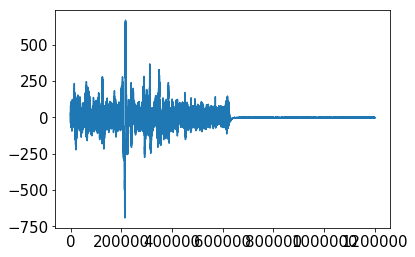

In [101]:
plt.plot(eeg_rawdata['sub1_1']['Time (EEG)'], eeg_rawdata['sub1_1']['Ch-8'])

## Adjusting timescales of auditory and meta awareness data
In the experiment the same time scale is used for EEG, auditory and meta awareness data. Time 0 ms denotes the start of each block, usually, there is a short delay until the first chunk of EEG data arrives.
Now the timescale is readjusted such that 0 ms corresponds to the arrival of the first octet of EEG data. The timestamps of auditory and meta awareness data are now relative to the onset of EEG recording, i. e. the time in ms that passed since the arrival of the first chunk of EEG data. Auditory stimuli that occured during the initial delay period are discarded for subsequent analysis.

In [102]:
auditory = {}
for sub in aud_files:
    # loading auditory data
    auditory[sub] = pd.read_csv(aud_files[sub], sep=',', index_col=False, skipfooter=2)
    # adjusting timescale
    auditory[sub].loc[:, 'Stimulus onset (audio)'] -= eeg_rawdata[sub].loc[0, 'Time (EEG)']
    # discarding events prior to EEG recording
    auditory[sub] = auditory[sub][auditory[sub]['Stimulus onset (audio)'] >= 0]

/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


In [103]:
mw = {}
for sub in mw_files:
    # loading meta awareness data (button presses)
    mw[sub] = pd.read_csv(mw_files[sub], sep=',', index_col=False, skipfooter=2)
    # adjusting timescale
    mw[sub].loc[:, 'Time (meta awareness)'] -= eeg_rawdata[sub].loc[0, 'Time (EEG)']

/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/ipykernel_launcher.py:4: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  after removing the cwd from sys.path.


## Rereferencing
TP<sub>9</sub> becomes the reference electrode for bipolar referencing. TP<sub>9</sub> is a substitute for M1 which was used as a reference electrode by Braboszcz et al.

In [104]:
eeg = {}
for sub in eeg_rawdata:
    rawdata = eeg_rawdata[sub]
    reref = pd.DataFrame()
    reref['Time (ms)'] = rawdata['Time (EEG)'] - rawdata.loc[0, 'Time (EEG)']  # adjusting timescale of EEG data
    reref['AFz'] = rawdata['Ch-1'] + rawdata['Ch-2'] + rawdata['Ch-3'] + rawdata['Ch-4'] + rawdata['Ch-5'] + rawdata['Ch-6'] + rawdata['Ch-7'] + rawdata['Ch-8']
    reref['Fz'] = rawdata['Ch-2'] + rawdata['Ch-3'] + rawdata['Ch-4'] + rawdata['Ch-5'] + rawdata['Ch-6'] + rawdata['Ch-7'] + rawdata['Ch-8']
    reref['FC3'] = rawdata['Ch-3'] + rawdata['Ch-4'] + rawdata['Ch-5'] + rawdata['Ch-6'] + rawdata['Ch-7'] + rawdata['Ch-8']
    reref['FC4'] = rawdata['Ch-4'] + rawdata['Ch-5'] + rawdata['Ch-6'] + rawdata['Ch-7'] + rawdata['Ch-8']
    reref['Cz'] = rawdata['Ch-5'] + rawdata['Ch-6'] + rawdata['Ch-7'] + rawdata['Ch-8']
    reref['Pz'] = rawdata['Ch-6'] + rawdata['Ch-7'] + rawdata['Ch-8']
    reref['O1'] = rawdata['Ch-7'] + rawdata['Ch-8']
    reref['O2'] = rawdata['Ch-8']
    eeg[sub] = reref

In [105]:
eeg['sub1_1'].tail()

,Time (ms),AFz,Fz,FC3,FC4,Cz,Pz,O1,O2
266461,1199934.0,-388.330081,-383.496096,-378.662112,-388.330081,-417.333987,-15.307617,-17.724609,-2.416992
266462,1199936.0,-57.202151,-70.898440,-103.125002,-58.007814,-1707.202114,-58.007814,-4.833984,-1.611328
266463,1199938.0,236.865254,220.751973,187.719746,223.168966,-606.665034,-30.615234,-13.696289,-2.416992
266464,1199950.0,45.922901,48.339893,53.979542,35.449269,1353.515669,9.667969,-26.586914,-2.416992
266465,1199953.0,-228.808614,-217.529317,-194.970723,-225.585957,895.898443,-1.611327,-20.947265,-2.416992


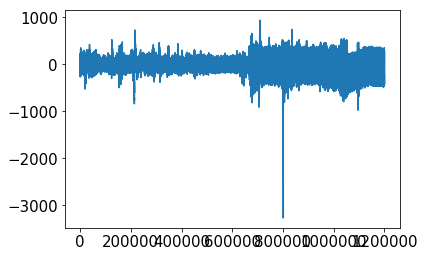

In [106]:
plt.plot(eeg['sub1_1']['Time (ms)'], eeg['sub1_1']['Fz'])

## Missing data
EEG recordings stopped after 1061488 ms in the first block of subject 7. Since the presentation of auditory stimuli continued for the rest of the block, auditory and meta awarenss data after 1061488 ms are discarded.

In [107]:
eeg['sub7_1'].tail()

,Time (ms),AFz,Fz,FC3,FC4,Cz,Pz,O1,O2
235776,1061465.0,-4.189453e+01,-4.592285e+01,-7.170410e+01,-3.867188e+01,-4.350586e+01,-1.933594e+01,-8.056641e+00,-2.336426e+01
235777,1061468.0,1.611328e+00,-4.833985e+00,-3.303223e+01,-8.862305e+00,-3.222656e+00,7.250977e+00,9.667969e+00,-1.208496e+01
235778,1061470.0,1.853027e+01,1.289062e+01,-2.336426e+01,-2.000000e-07,4.833984e+00,1.450195e+01,1.208496e+01,-1.208496e+01
235779,1061485.0,-1.530762e+01,-1.691895e+01,-5.478516e+01,-2.416992e+01,-2.658691e+01,-1.047363e+01,-8.862305e+00,-3.303223e+01
235780,1061488.0,8.492280e+06,7.430765e+06,6.369239e+06,5.307710e+06,4.246178e+06,3.184644e+06,2.123101e+06,1.061554e+06


In [108]:
auditory['sub7_1'] = auditory['sub7_1'][auditory['sub7_1']['Stimulus onset (audio)'] < 1061488]
mw['sub7_1'] = mw['sub7_1'][mw['sub7_1']['Time (meta awareness)'] < 1061488]

## Creating MNE raw objects
In general, MNE does not support ```.csv``` as an input file format. However, it's possible to manually create MNE raw objects using numpy arrays (see [MNE documentation](https://mne.tools/stable/auto_examples/io/plot_objects_from_arrays.html#sphx-glr-auto-examples-io-plot-objects-from-arrays-py)).
Unfortunately, there is no way to handle the Traumschreiber's inconstant sampling rate within MNE. Time is not explcicitly represented, instead the timestamp of each EEG data vector is inferred from the total number of samples and the sampling rate. In consequence, MNE presupposes a constant sampling rate. This issue will be adressed in the epoching section (see below).

Creating RawArray with float64 data, n_channels=8, n_times=266466
    Range : 0 ... 266465 =      0.000 ...  1200.293 secs
Ready.


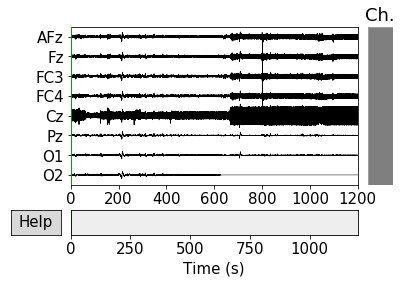

Creating RawArray with float64 data, n_channels=8, n_times=266294
    Range : 0 ... 266293 =      0.000 ...  1199.518 secs
Ready.


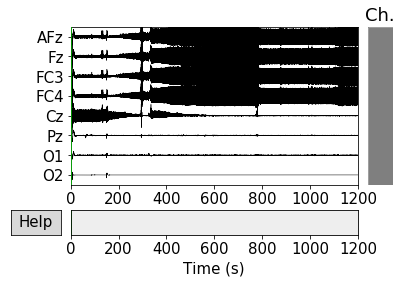

Creating RawArray with float64 data, n_channels=8, n_times=266564
    Range : 0 ... 266563 =      0.000 ...  1200.734 secs
Ready.


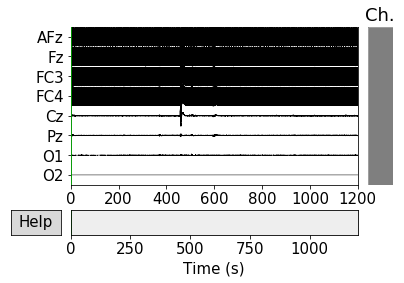

Creating RawArray with float64 data, n_channels=8, n_times=242153
    Range : 0 ... 242152 =      0.000 ...  1090.775 secs
Ready.


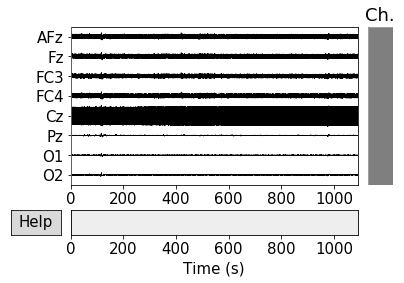

Creating RawArray with float64 data, n_channels=8, n_times=249588
    Range : 0 ... 249587 =      0.000 ...  1124.266 secs
Ready.


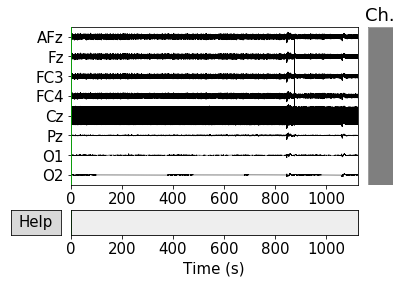

Creating RawArray with float64 data, n_channels=8, n_times=266351
    Range : 0 ... 266350 =      0.000 ...  1199.775 secs
Ready.


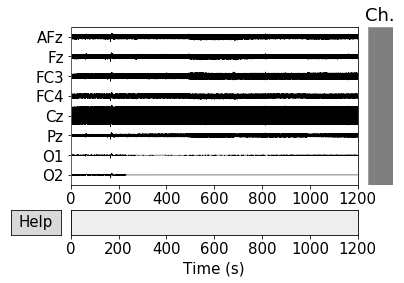

Creating RawArray with float64 data, n_channels=8, n_times=253136
    Range : 0 ... 253135 =      0.000 ...  1140.248 secs
Ready.


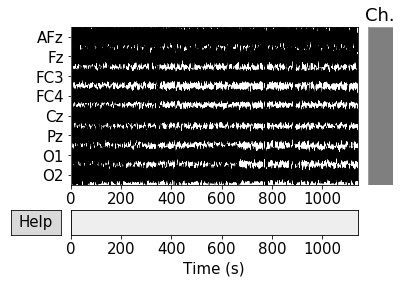

Creating RawArray with float64 data, n_channels=8, n_times=266560
    Range : 0 ... 266559 =      0.000 ...  1200.716 secs
Ready.


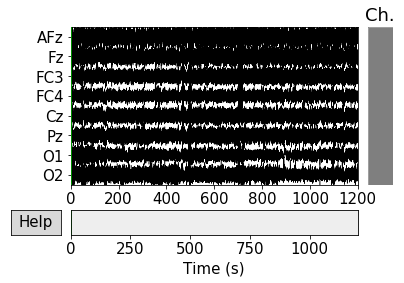

Creating RawArray with float64 data, n_channels=8, n_times=266659
    Range : 0 ... 266658 =      0.000 ...  1201.162 secs
Ready.


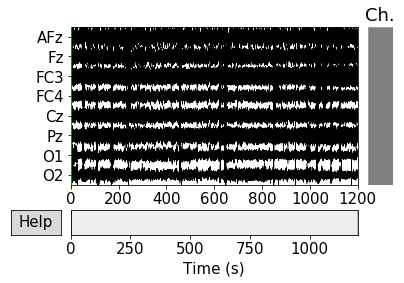

Creating RawArray with float64 data, n_channels=8, n_times=266127
    Range : 0 ... 266126 =      0.000 ...  1198.766 secs
Ready.


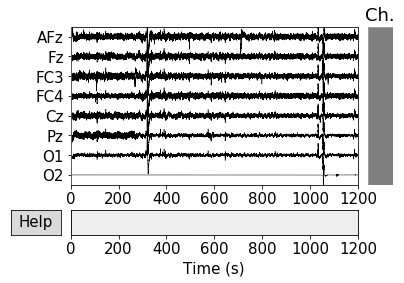

Creating RawArray with float64 data, n_channels=8, n_times=266526
    Range : 0 ... 266525 =      0.000 ...  1200.563 secs
Ready.


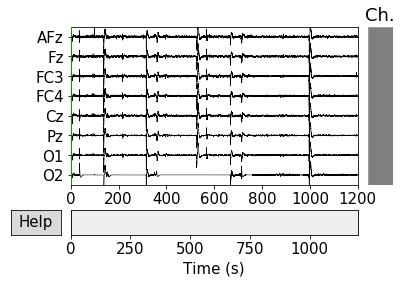

Creating RawArray with float64 data, n_channels=8, n_times=266479
    Range : 0 ... 266478 =      0.000 ...  1200.351 secs
Ready.


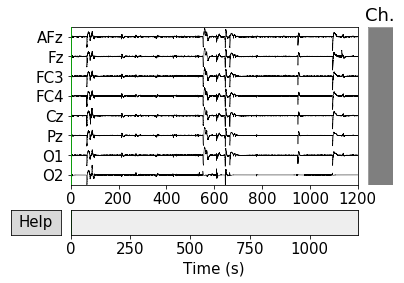

Creating RawArray with float64 data, n_channels=8, n_times=266598
    Range : 0 ... 266597 =      0.000 ...  1200.887 secs
Ready.


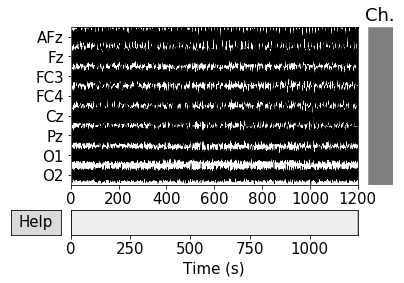

Creating RawArray with float64 data, n_channels=8, n_times=266513
    Range : 0 ... 266512 =      0.000 ...  1200.505 secs
Ready.


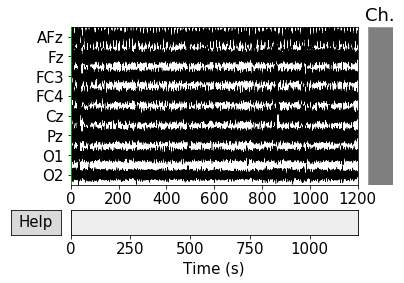

Creating RawArray with float64 data, n_channels=8, n_times=266545
    Range : 0 ... 266544 =      0.000 ...  1200.649 secs
Ready.


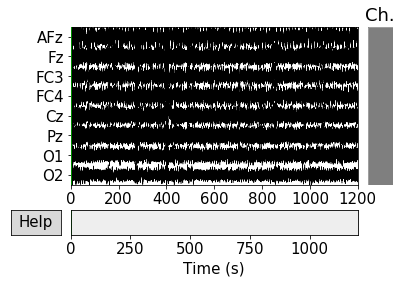

Creating RawArray with float64 data, n_channels=8, n_times=235781
    Range : 0 ... 235780 =      0.000 ...  1062.072 secs
Ready.


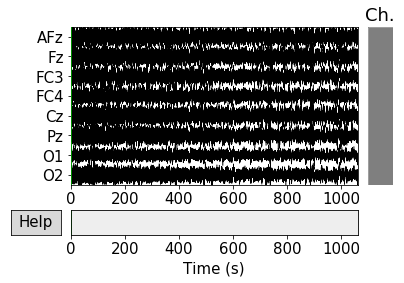

Creating RawArray with float64 data, n_channels=8, n_times=266533
    Range : 0 ... 266532 =      0.000 ...  1200.595 secs
Ready.


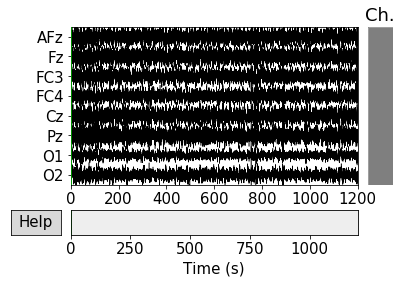

Creating RawArray with float64 data, n_channels=8, n_times=266452
    Range : 0 ... 266451 =      0.000 ...  1200.230 secs
Ready.


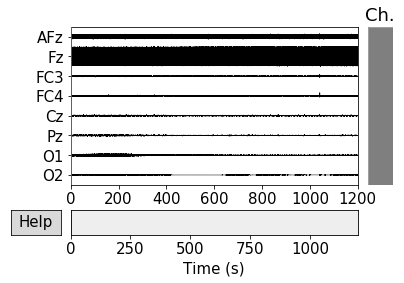

Creating RawArray with float64 data, n_channels=8, n_times=266542
    Range : 0 ... 266541 =      0.000 ...  1200.635 secs
Ready.


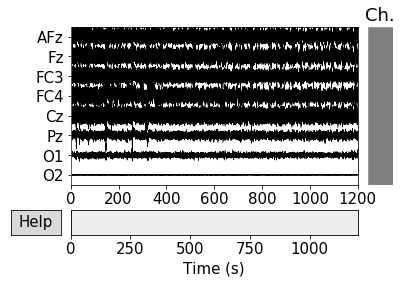

Creating RawArray with float64 data, n_channels=8, n_times=266505
    Range : 0 ... 266504 =      0.000 ...  1200.468 secs
Ready.


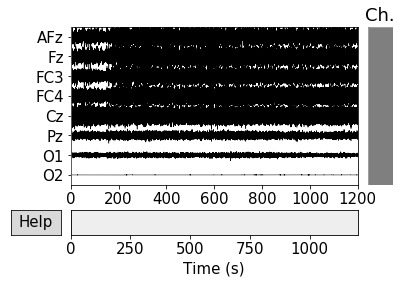

Creating RawArray with float64 data, n_channels=8, n_times=266591
    Range : 0 ... 266590 =      0.000 ...  1200.856 secs
Ready.


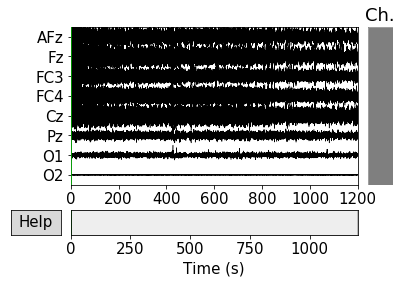

Creating RawArray with float64 data, n_channels=8, n_times=266532
    Range : 0 ... 266531 =      0.000 ...  1200.590 secs
Ready.


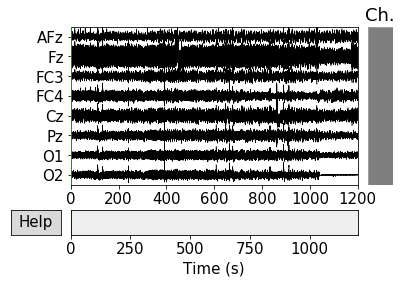

Creating RawArray with float64 data, n_channels=8, n_times=266528
    Range : 0 ... 266527 =      0.000 ...  1200.572 secs
Ready.


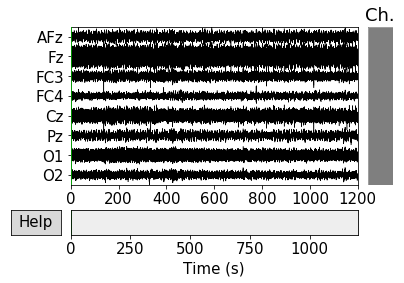

Creating RawArray with float64 data, n_channels=8, n_times=266185
    Range : 0 ... 266184 =      0.000 ...  1199.027 secs
Ready.


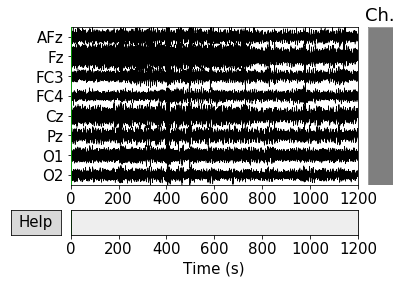

Creating RawArray with float64 data, n_channels=8, n_times=266526
    Range : 0 ... 266525 =      0.000 ...  1200.563 secs
Ready.


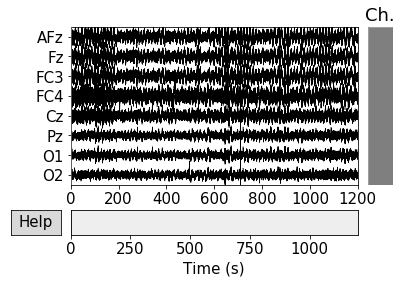

Creating RawArray with float64 data, n_channels=8, n_times=266689
    Range : 0 ... 266688 =      0.000 ...  1201.297 secs
Ready.


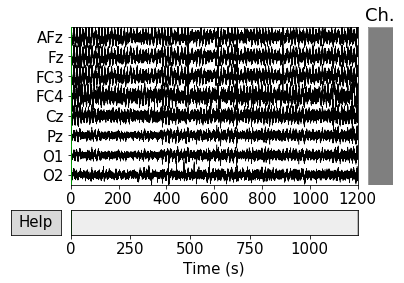

Creating RawArray with float64 data, n_channels=8, n_times=266660
    Range : 0 ... 266659 =      0.000 ...  1201.167 secs
Ready.


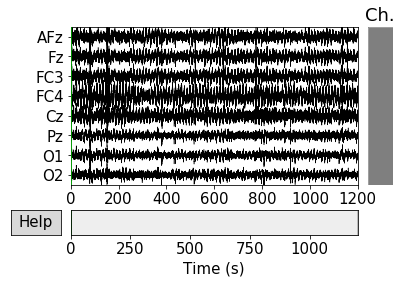

Creating RawArray with float64 data, n_channels=8, n_times=266465
    Range : 0 ... 266464 =      0.000 ...  1200.288 secs
Ready.


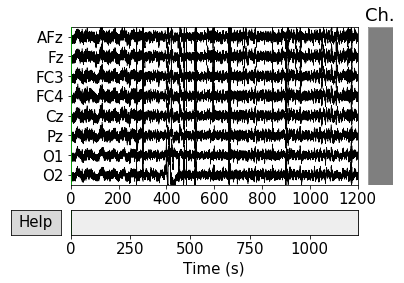

Creating RawArray with float64 data, n_channels=8, n_times=266574
    Range : 0 ... 266573 =      0.000 ...  1200.779 secs
Ready.


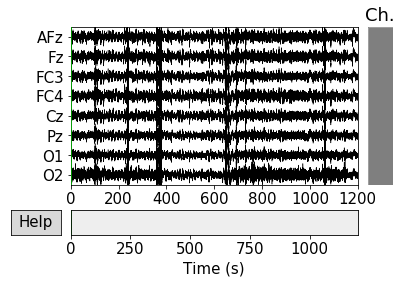

Creating RawArray with float64 data, n_channels=8, n_times=266560
    Range : 0 ... 266559 =      0.000 ...  1200.716 secs
Ready.


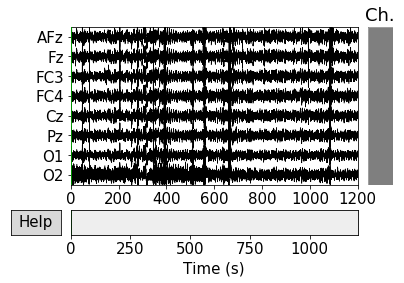

In [109]:
# Create info structure needed by MNE
ch_names = ['AFz', 'Fz', 'FC3', 'FC4', 'Cz', 'Pz', 'O1', 'O2' ]
ch_types = 'eeg'
sampling_freq = 222
montage = '/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/channels/data/montages/standard_1020.elc'
info = mne.create_info(ch_names, sampling_freq, ch_types=ch_types, montage=montage)

raw = {} # dictionary containing rereferenced EEG data as MNE objects

for sub in eeg:
    data = eeg[sub].iloc[:,1:].to_numpy().T
    raw[sub] = mne.io.RawArray(data, info)
    fig = raw[sub].plot(n_channels=8, duration=1200, scalings='auto')
    fig.suptitle(str(sub)) 

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


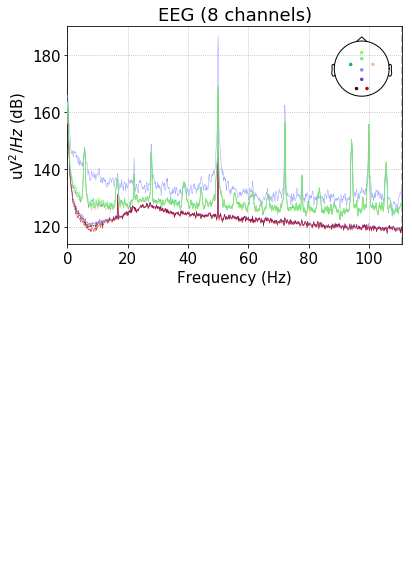

Effective window size : 9.225 (s)


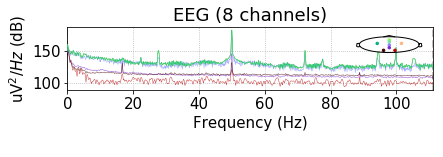

Effective window size : 9.225 (s)


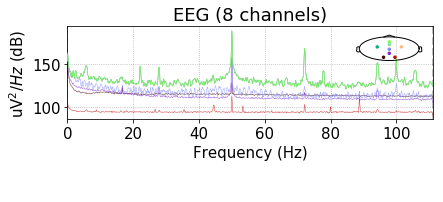

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


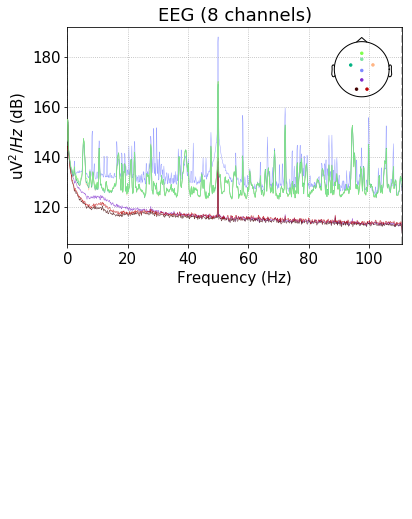

Effective window size : 9.225 (s)


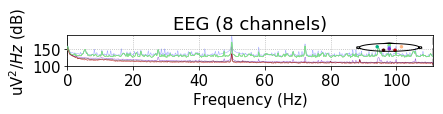

Effective window size : 9.225 (s)


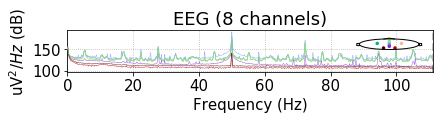

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


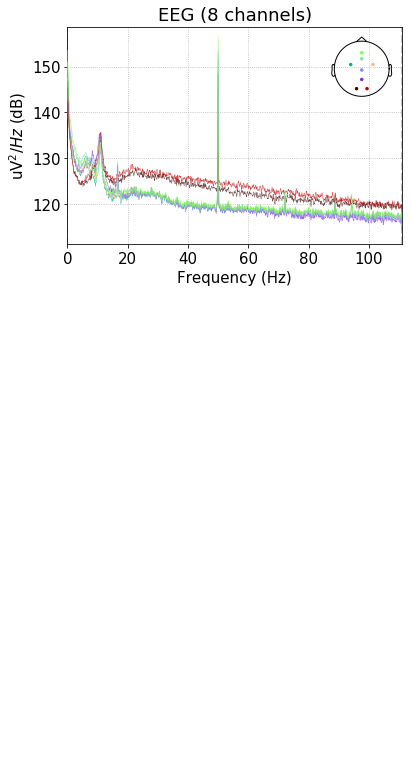

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


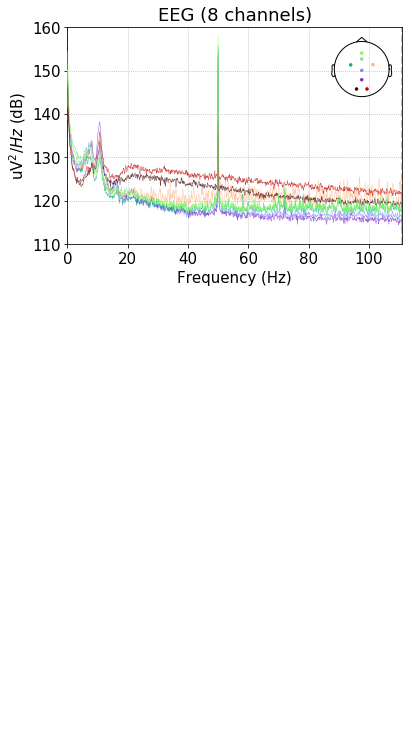

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


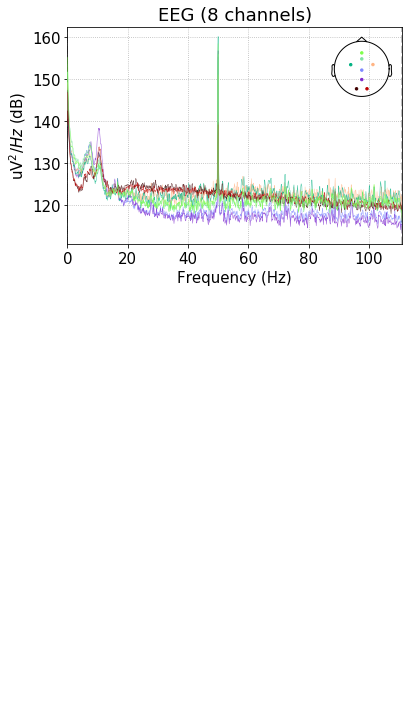

Effective window size : 9.225 (s)


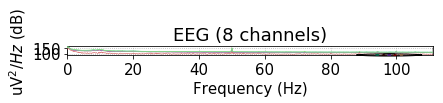

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


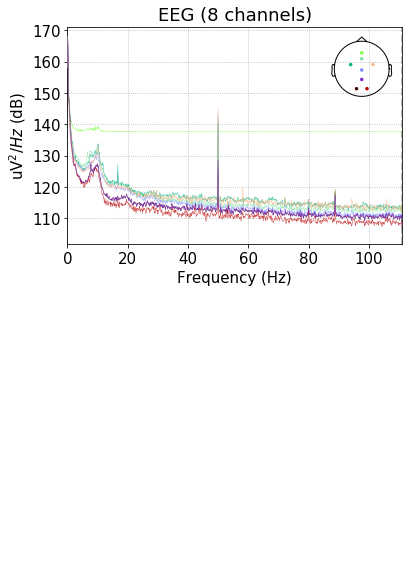

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


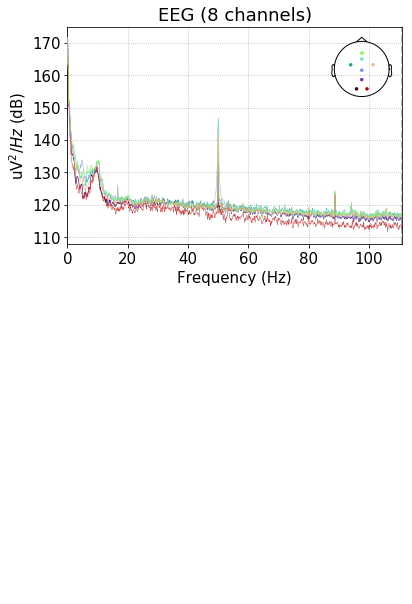

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


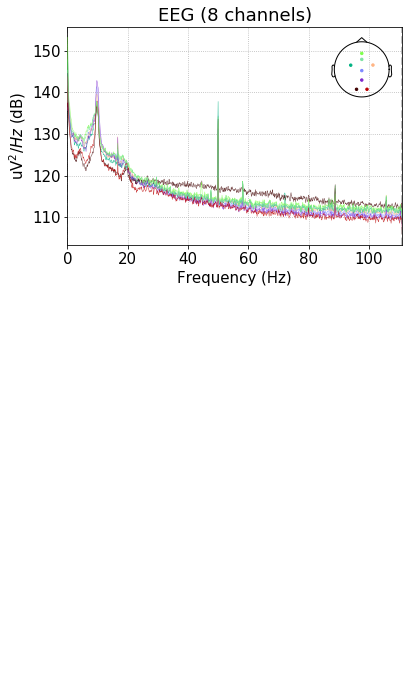

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


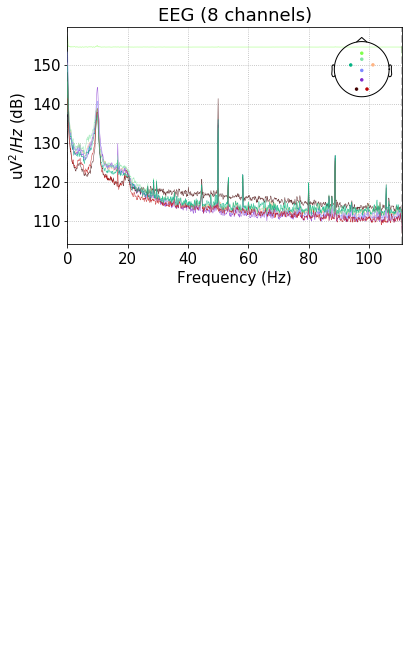

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


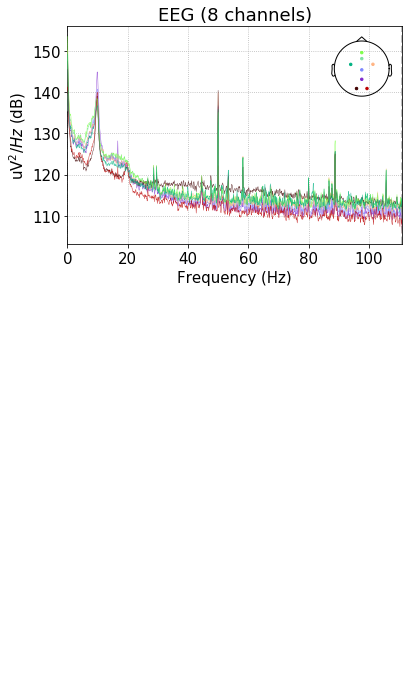

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


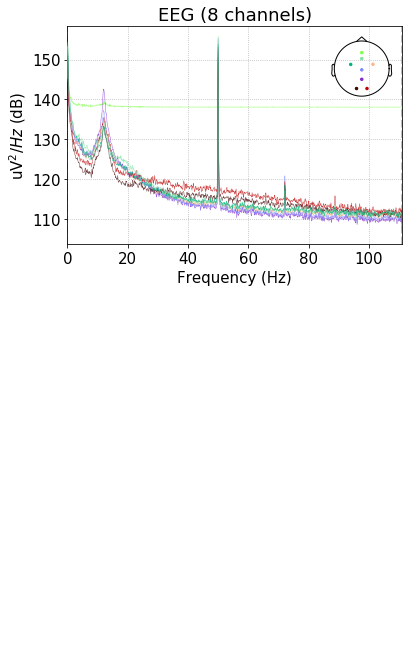

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


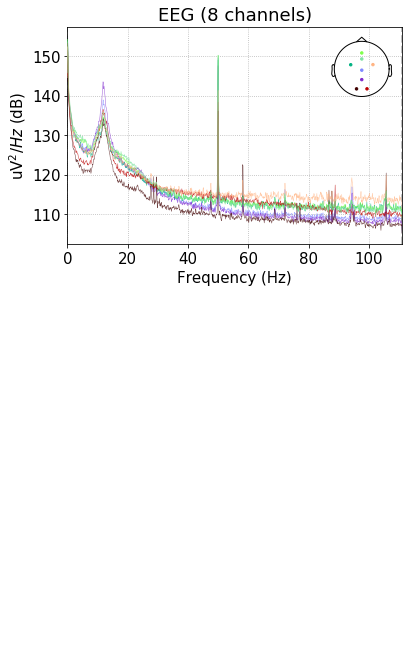

Effective window size : 9.225 (s)


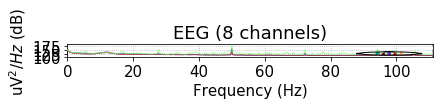

Effective window size : 9.225 (s)


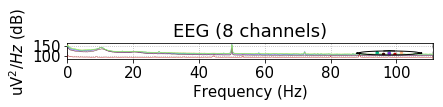

Effective window size : 9.225 (s)


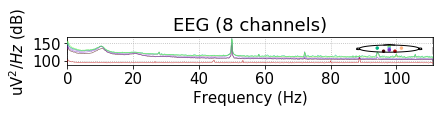

Effective window size : 9.225 (s)


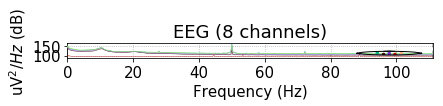

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


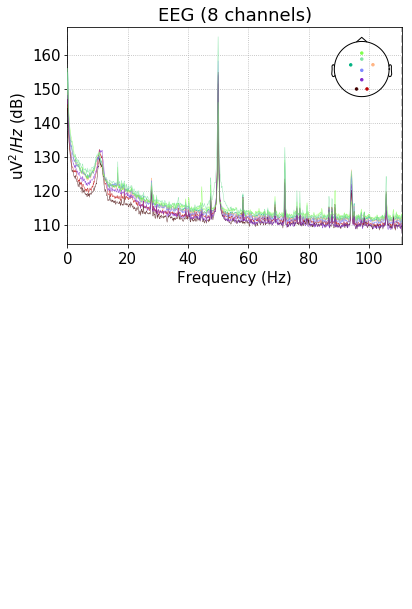

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


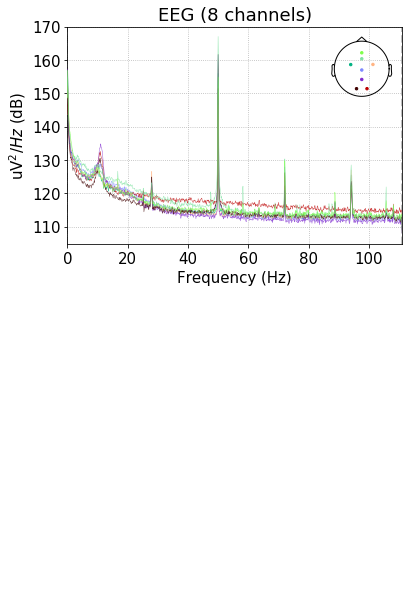

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


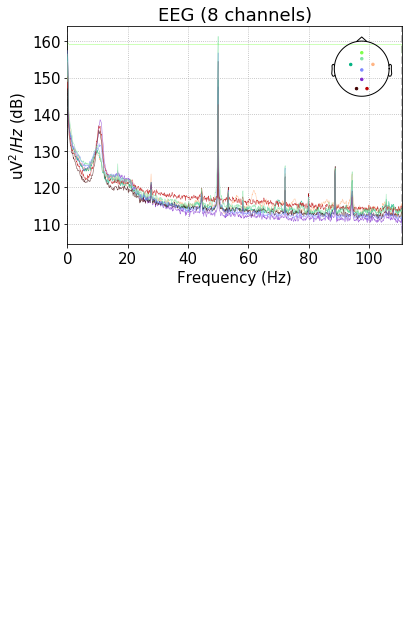

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


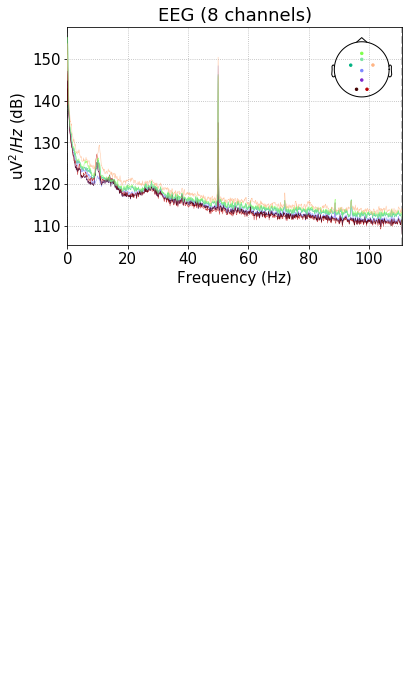

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


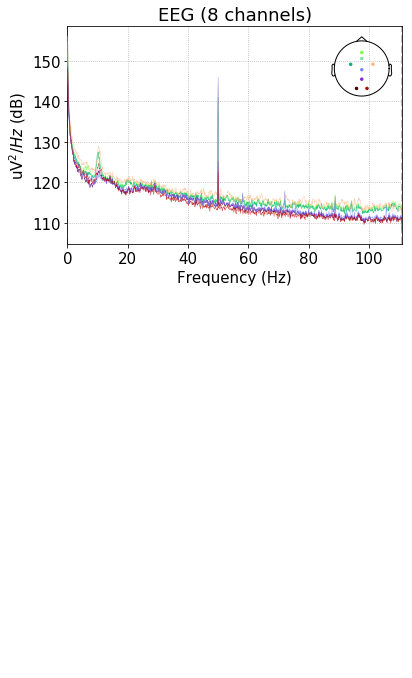

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


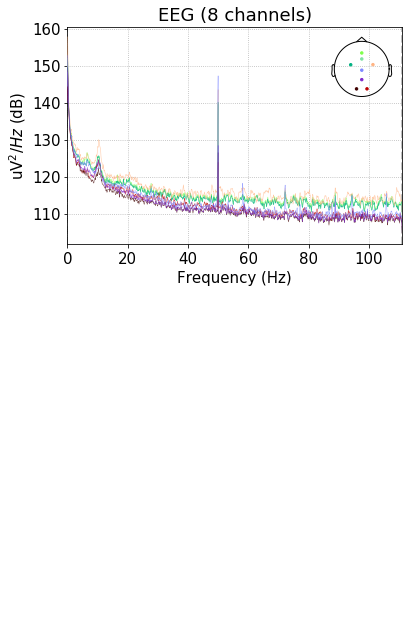

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


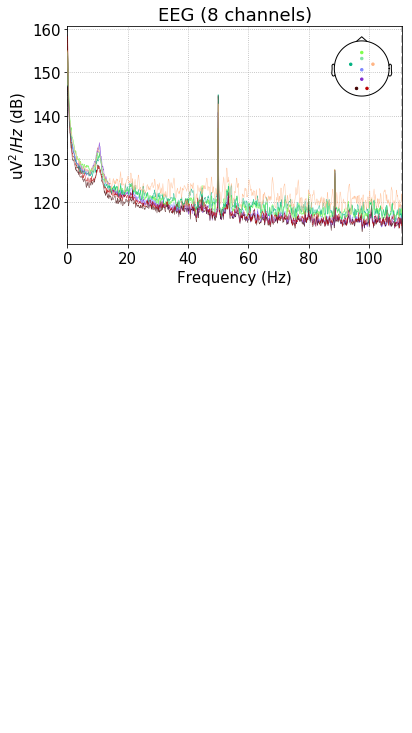

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


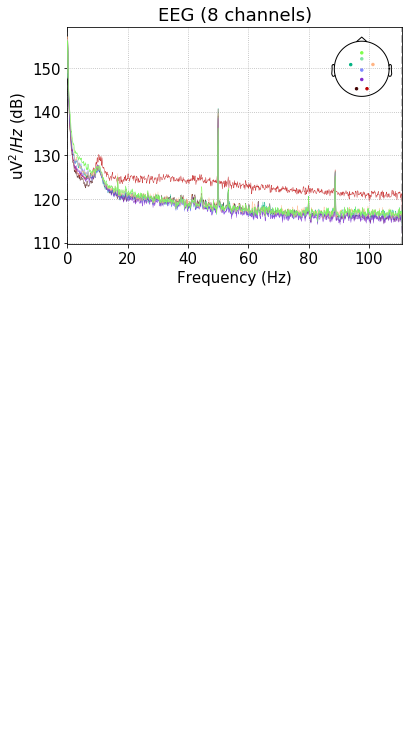

Effective window size : 9.225 (s)


<ipython-input-110-e96de6a3aaf7>:3: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


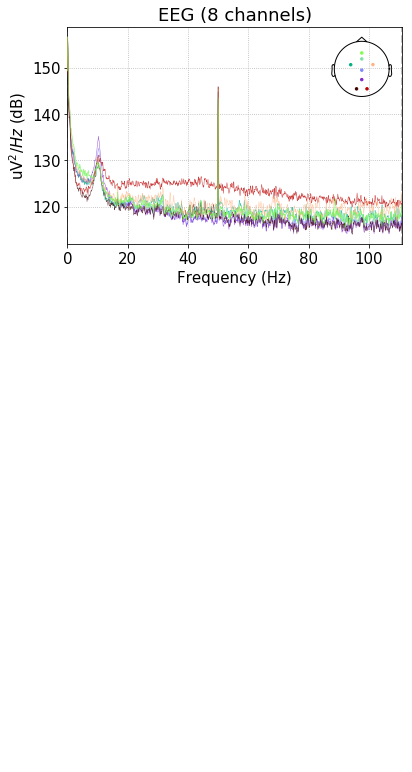

In [110]:
# Spectral Power density of raw EEG data for each block
for sub in raw:
    raw[sub].plot_psd()

## Artificat detection: Independent Component Analysis (ICA)
Braboszcz et al. used Infomax ICA for artificat detection. The idea of ICA is to separate artifacts like eye blinks, lateral eye movement, heartbeat or other muscle noise from neural sources. Once independet components of the data have been identified some of those components can be marked as artifacts for removal in order to increasing the signal to noise rations (SNR).

As one can see below, it is not possbile to clearly identify which components of the Traumschreiber EEG data are artififacts. The data seem to be too noisy, almost all components look like artifacts. In this case, ICA does not help increasing the signal to noise ratio (SNR).

In [111]:
# copy raw data and apply high-pass filter at 1 Hz
raw_ica = {}
for sub in raw:
    raw_ica[sub] = raw[sub].copy()
    raw_ica[sub] = raw_ica[sub].load_data().filter(l_freq=1., h_freq=None)

Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting up high-pass filter at 1 Hz
l_trans_bandwidth chosen to be 1.0 Hz
Filter length of 733 samples (3.302 sec) selected
Setting 

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.3s.


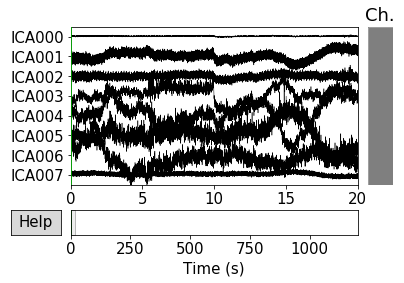

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 21.8s.


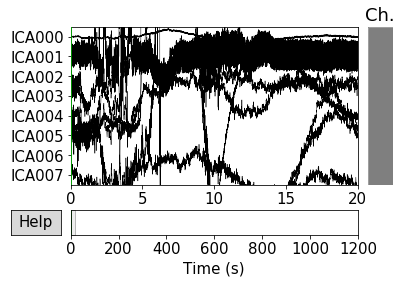

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 24.4s.


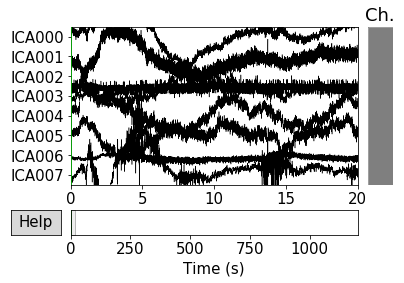

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 16.8s.


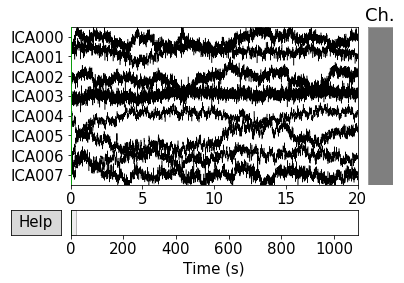

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 18.8s.


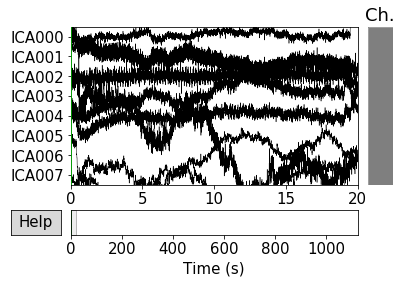

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 19.2s.


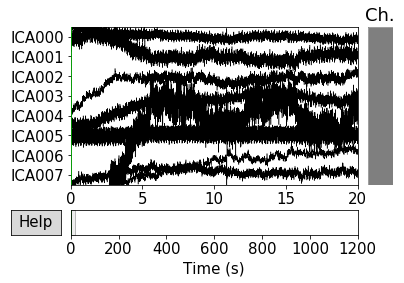

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.6s.


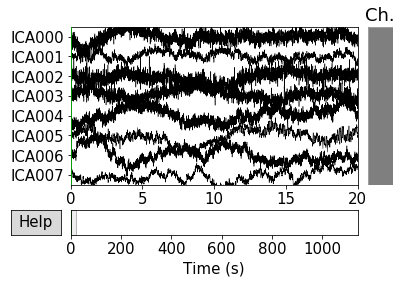

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 18.0s.


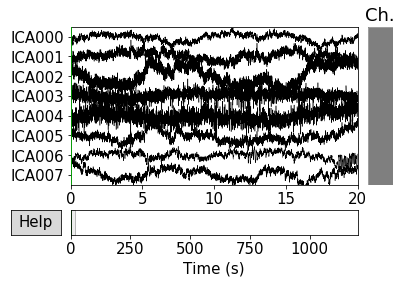

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 18.0s.


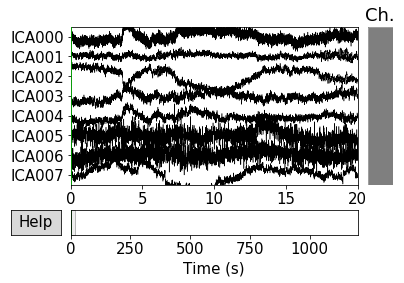

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 20.7s.


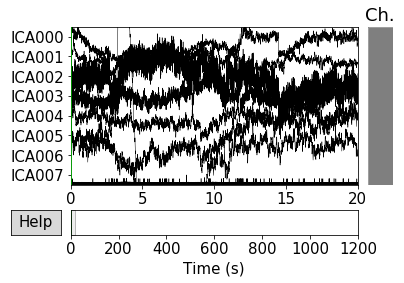

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 21.8s.


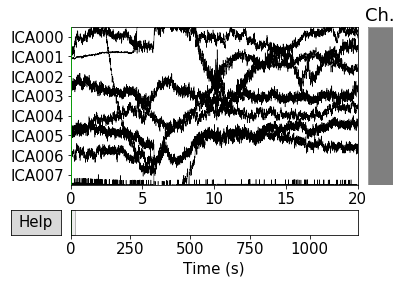

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 18.0s.


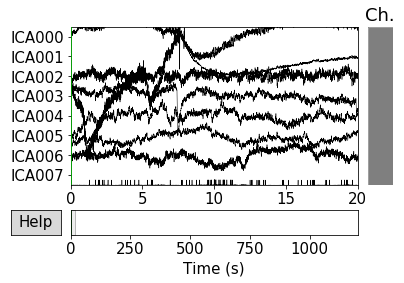

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.6s.


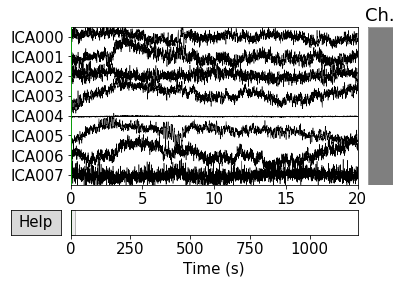

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 27.7s.


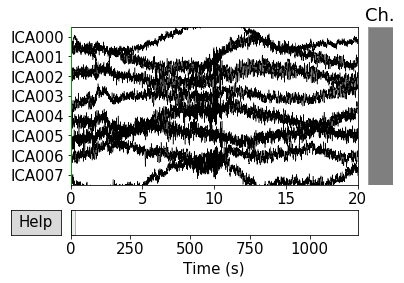

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.3s.


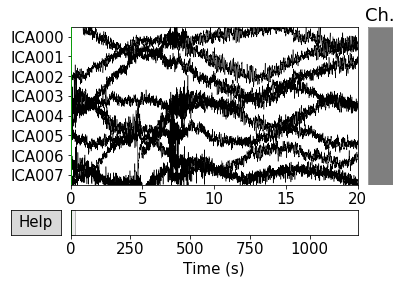

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 21.9s.


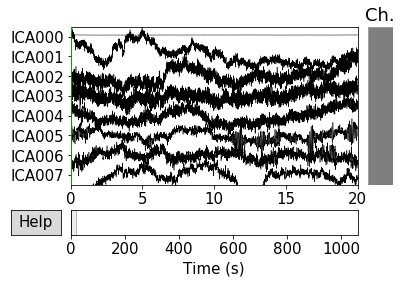

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 16.7s.


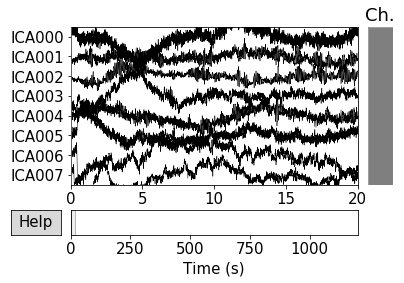

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 16.8s.


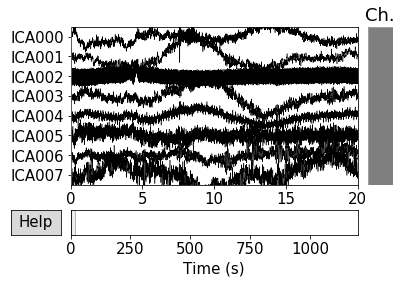

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.5s.


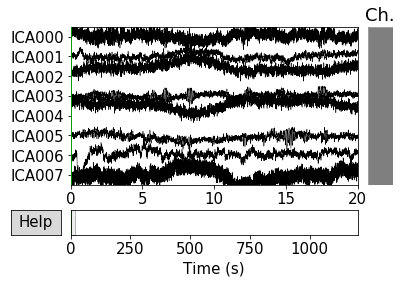

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.7s.


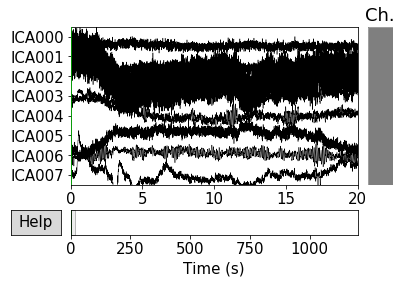

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.7s.


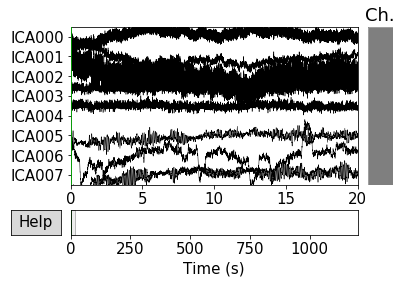

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.8s.


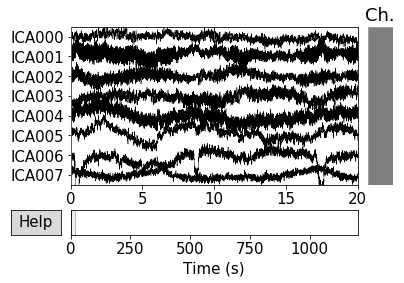

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.3s.


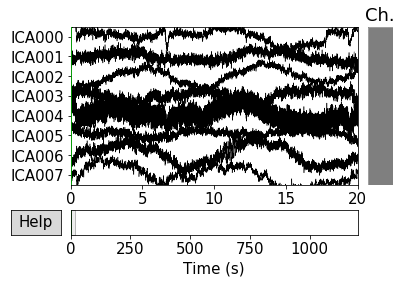

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 


/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/mne/preprocessing/infomax_.py:192: RuntimeWarning: overflow encountered in exp
  y = 1.0 / (1.0 + np.exp(-u))


Fitting ICA took 20.6s.


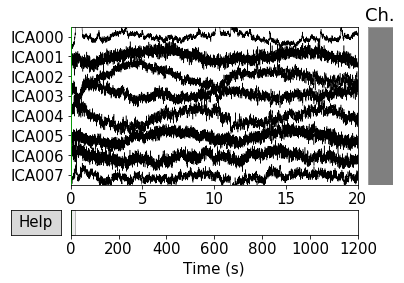

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.0s.


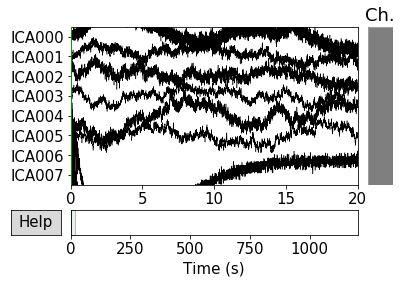

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 387.0s.


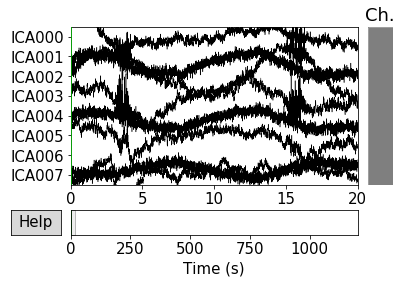

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.9s.


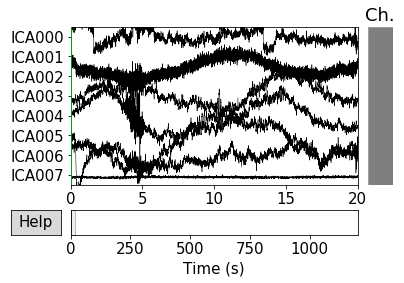

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.3s.


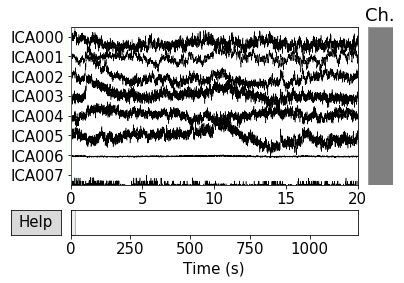

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.4s.


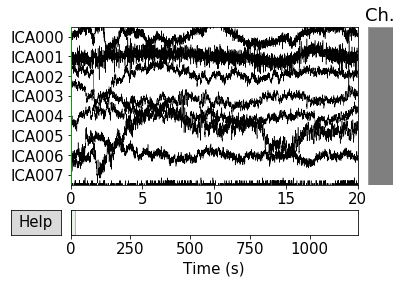

Fitting ICA to data using 8 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Using all PCA components: 8
 
Fitting ICA took 17.4s.


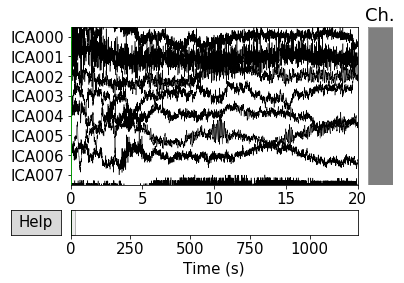

In [112]:
# fitting ICA
ica = {}
for sub in raw_ica:
    ica[sub] = mne.preprocessing.ICA(method='infomax', random_state=42)  # seed is set for replicability
    ica[sub] = ica[sub].fit(raw_ica[sub])
    ica[sub].plot_sources(raw[sub])  # visualizing independent components

## Filtering
Braboszcz et al. applied a non-linear elliptic high-pass filter and an non-linear elliptic notch filter between 45 Hz and 55 Hz. For visualizing the data Braboszcz et al. additionally used a 30 Hz linear low-pass filter, however, the data is not low-pass filtered for statistics. Due to the noisy data in the present case and the presence of very high frequencies in the data (see spectral power density) a band-pass filter from 1 to 30 Hz is used.

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


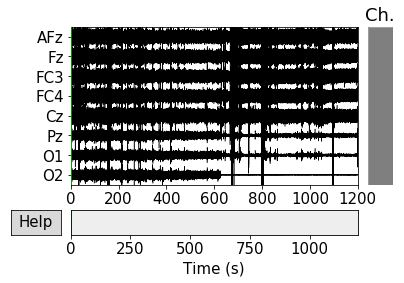

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


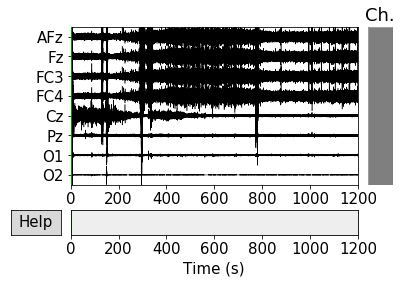

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


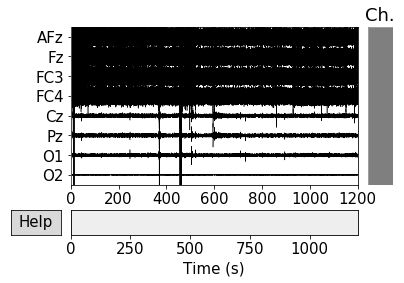

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


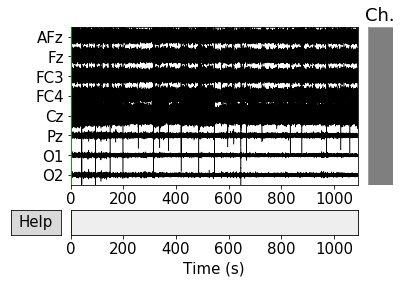

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


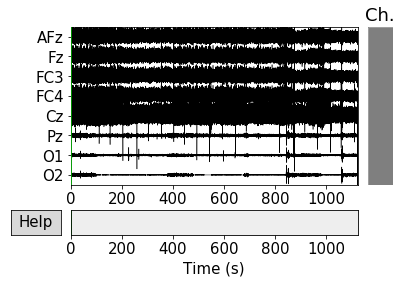

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


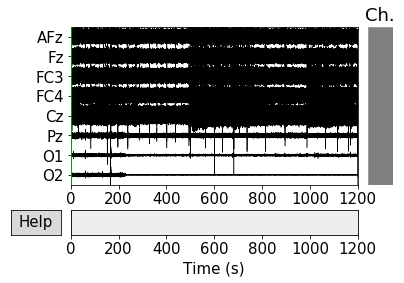

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


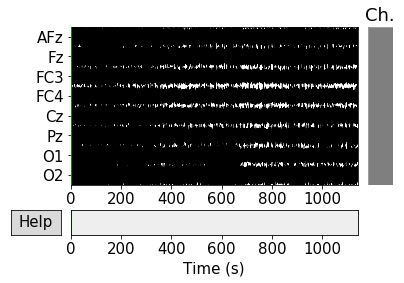

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


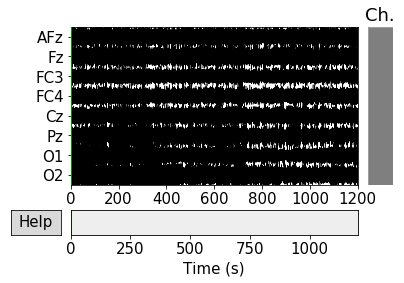

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


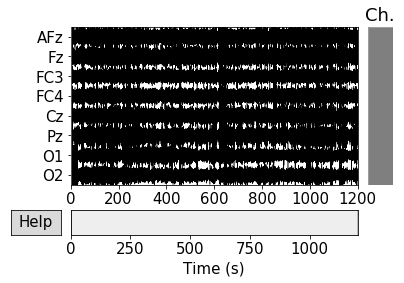

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


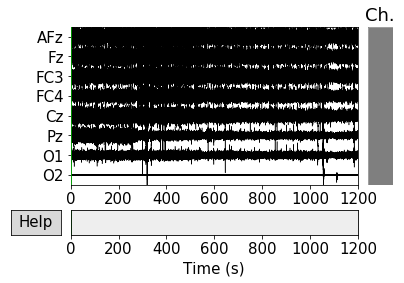

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


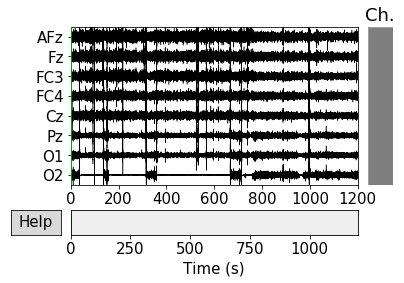

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


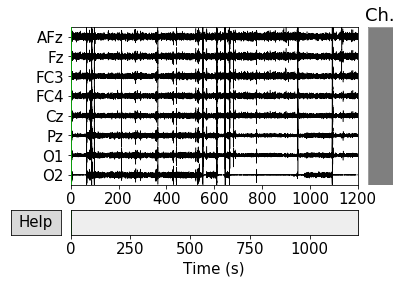

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


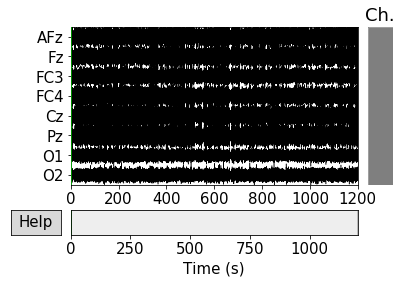

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


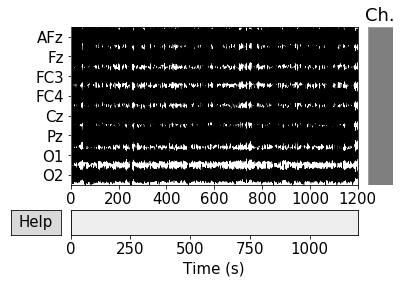

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


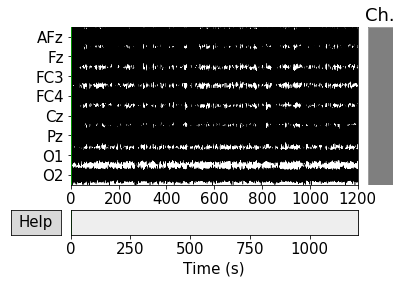

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


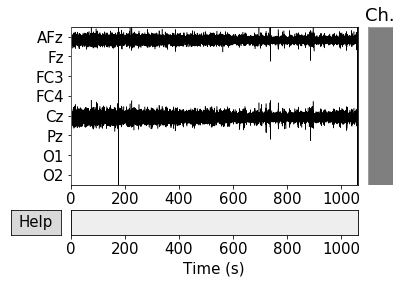

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


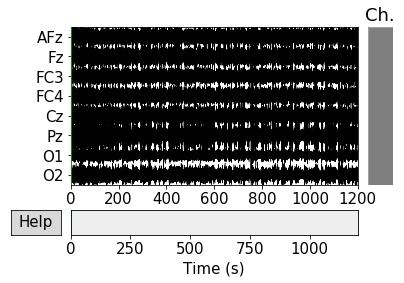

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


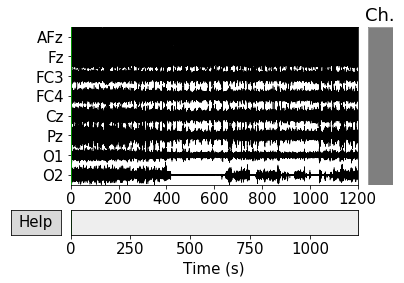

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


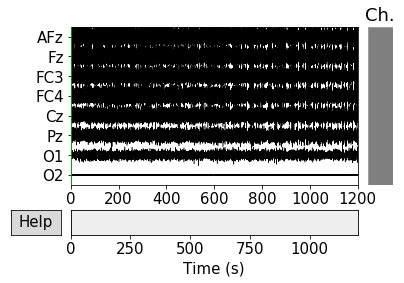

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


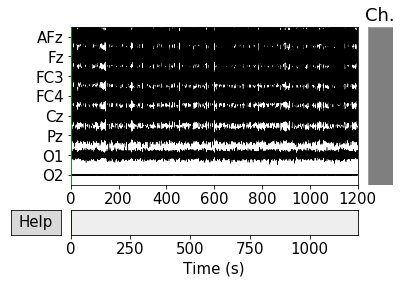

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


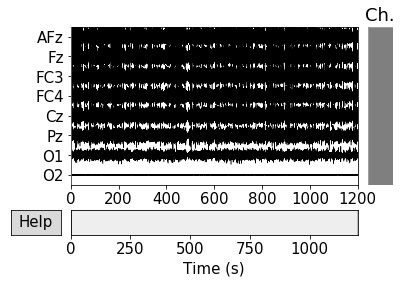

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


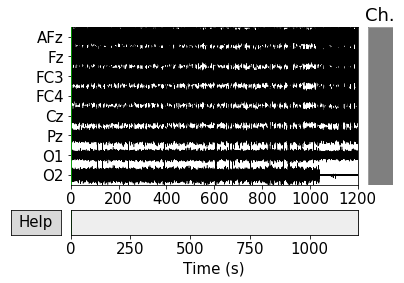

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


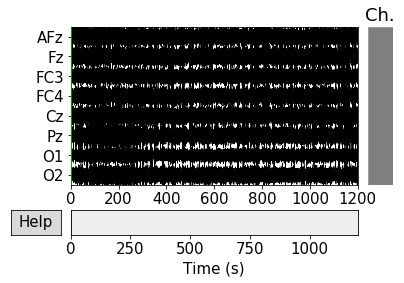

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


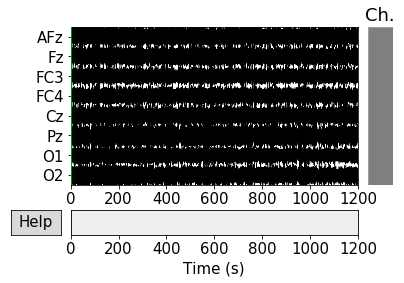

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


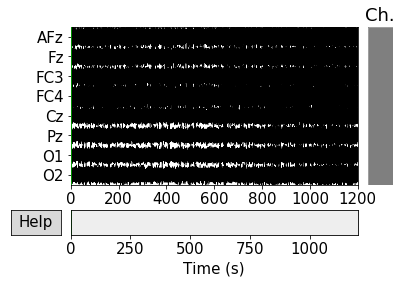

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


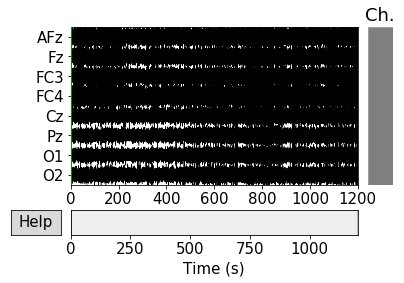

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


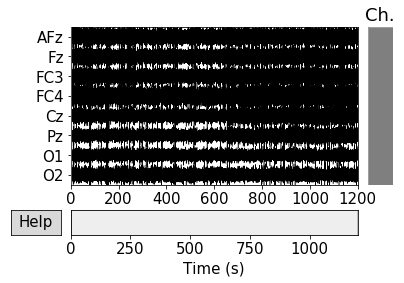

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


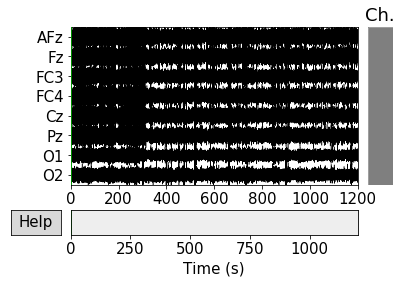

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


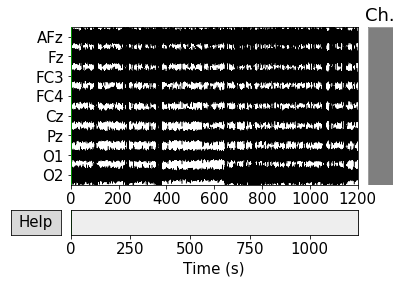

Setting up band-pass filter from 1 - 30 Hz
l_trans_bandwidth chosen to be 1.0 Hz
h_trans_bandwidth chosen to be 7.5 Hz
Filter length of 733 samples (3.302 sec) selected


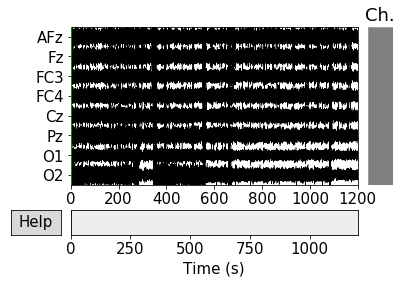

In [113]:
# band-pass filter from 1 - 30 Hz
for sub in raw:
    raw[sub] = raw[sub].load_data().filter(l_freq=1., h_freq=30.)
    raw[sub].plot(n_channels=8, duration=1200, scalings='auto')

Effective window size : 9.225 (s)


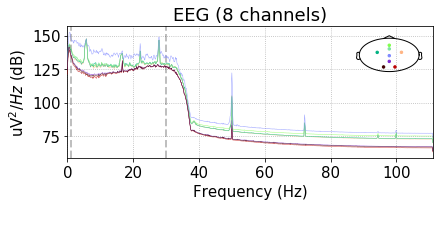

Effective window size : 9.225 (s)


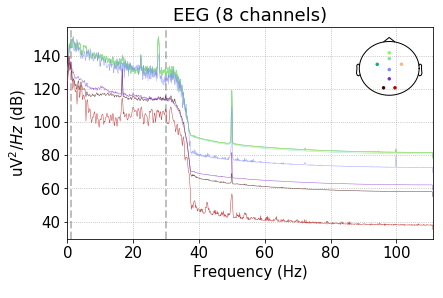

Effective window size : 9.225 (s)


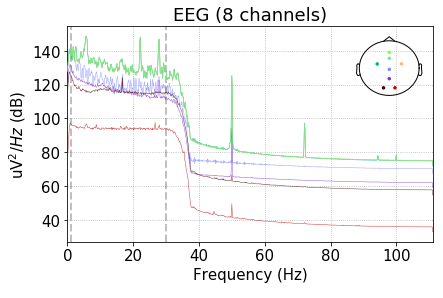

Effective window size : 9.225 (s)


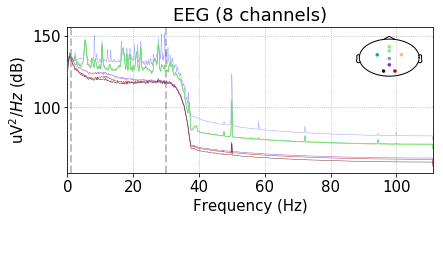

Effective window size : 9.225 (s)


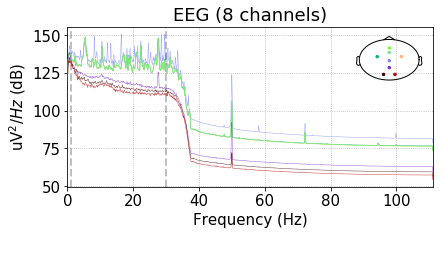

Effective window size : 9.225 (s)


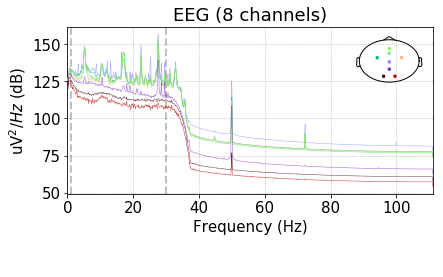

Effective window size : 9.225 (s)


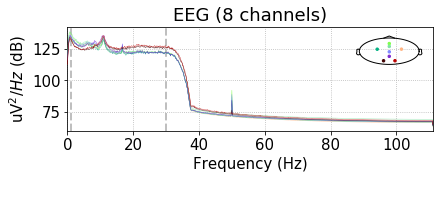

Effective window size : 9.225 (s)


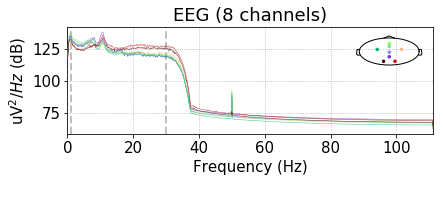

Effective window size : 9.225 (s)


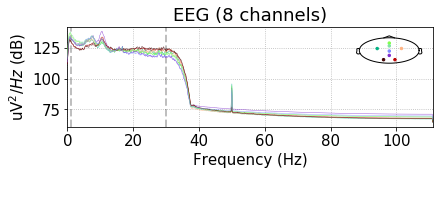

Effective window size : 9.225 (s)


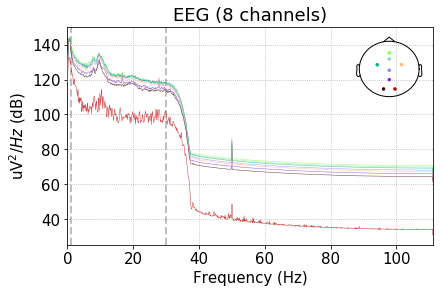

Effective window size : 9.225 (s)


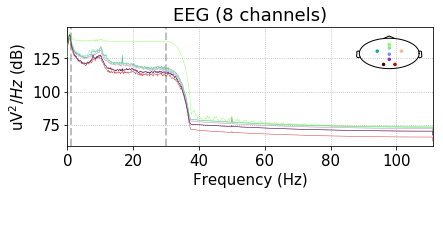

Effective window size : 9.225 (s)


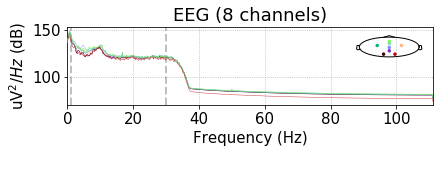

Effective window size : 9.225 (s)


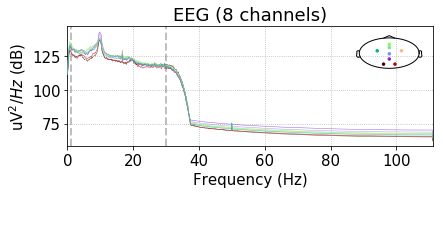

Effective window size : 9.225 (s)


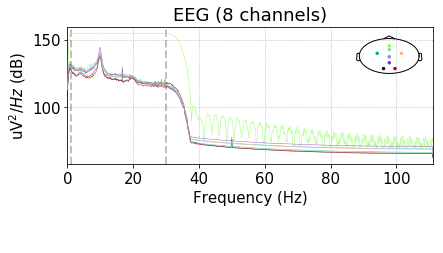

Effective window size : 9.225 (s)


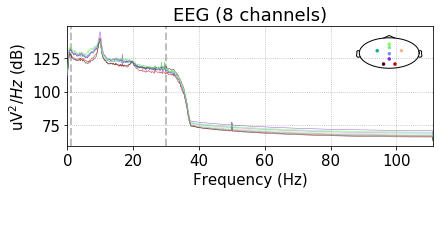

Effective window size : 9.225 (s)


<ipython-input-114-b57ffb274286>:2: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  raw[sub].plot_psd()


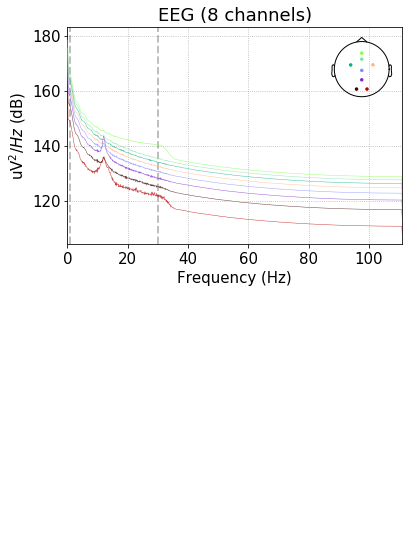

Effective window size : 9.225 (s)


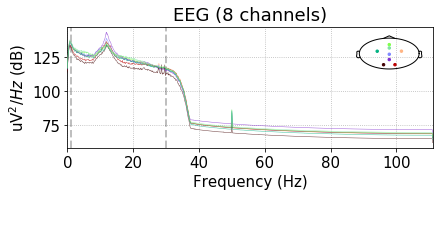

Effective window size : 9.225 (s)


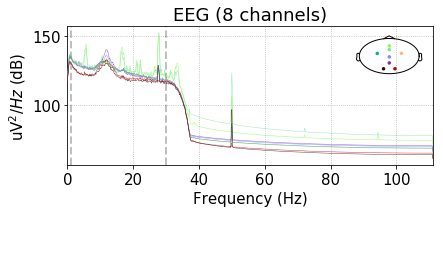

Effective window size : 9.225 (s)


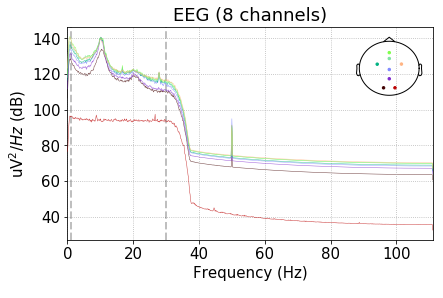

Effective window size : 9.225 (s)


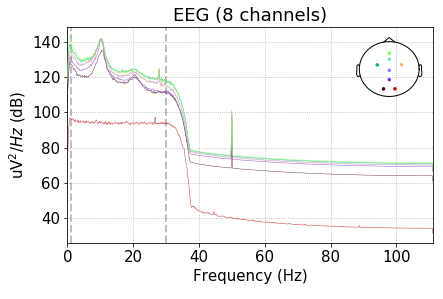

Effective window size : 9.225 (s)


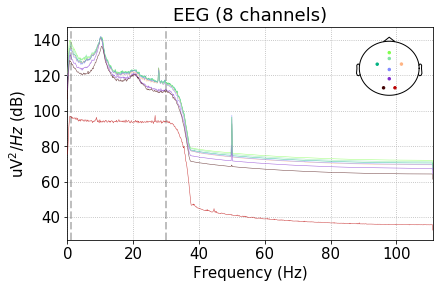

Effective window size : 9.225 (s)


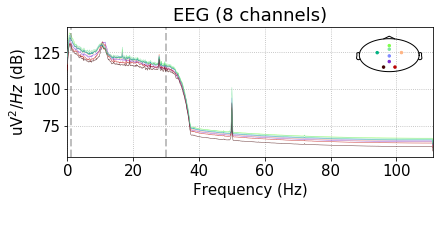

Effective window size : 9.225 (s)


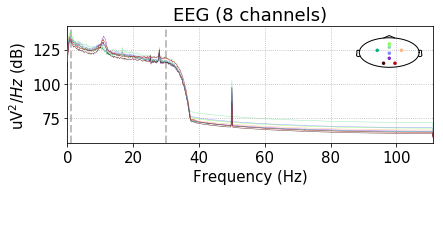

Effective window size : 9.225 (s)


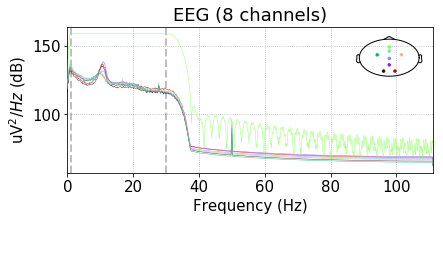

Effective window size : 9.225 (s)


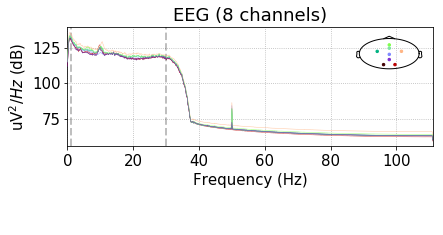

Effective window size : 9.225 (s)


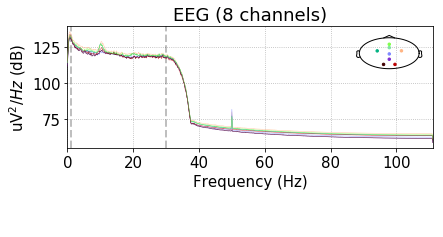

Effective window size : 9.225 (s)


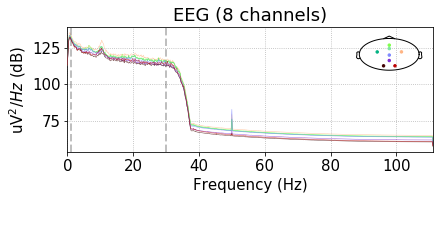

Effective window size : 9.225 (s)


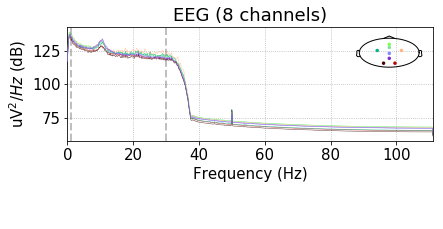

Effective window size : 9.225 (s)


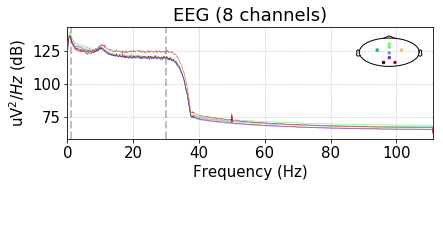

Effective window size : 9.225 (s)


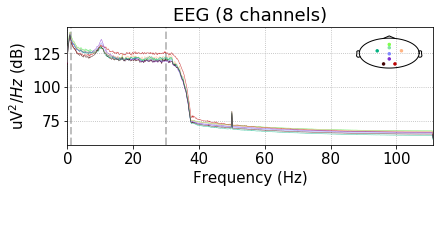

In [114]:
for sub in raw:
    raw[sub].plot_psd()

## Epoching - Event Related Potentials (ERPs)
MNE does not support two level epoching, i. e. computing epochs for mind wandering and breath focus on the first level and subepochs for standard and oddball stimuli on the former epochs. Therefore, the event codes have to be manipulated before epoching. 10 sec intervals prior and post button presses are extracted and within those 10 sec intervals, new event codes are assigned to standard and oddball auditory stimuli:
* 0 : standard auditory stimulus (more than 10 sec prior or post button press or -1 / +2 sec around button press)
* 1 : odbball auditory stimulus (more than 10 sec prior or post button press or -1 / +2 sec around button press)
* 2 : button press / meta awareness
* 3 : breath focus & oddball auditory stimulus
* 4 : breath focus & standard auditory stimulus
* 5 : mind wandering & oddball auditory stimulus
* 6 : mind wandering & standard auditory stimulus
* 7 : ambiguous --> conditions overlap, i. e. more than one meta awareness event occurs within 20 seconds

Again, since the present file format of Traumschreiber EEG data is not compatible with MNE's automatic event recognition functions, event files have to be created manually.

In [115]:
focused = {0:4, 1:3, 3:3, 4:4, 5:7, 6:7, 7:7}
wandering = {0:6, 1:5, 3:7, 4:7, 5:5, 6:6, 7:7}

for sub in auditory:
    mw[sub].loc[:, 'Stimulus type'] = 2
    df = auditory[sub]
    for idx, time in enumerate(mw[sub]['Time (meta awareness)']):
        mask_wandering = (df['Stimulus onset (audio)'] > time - 10000) & (df['Stimulus onset (audio)'] < time - 2000)
        mask_focused = (df['Stimulus onset (audio)'] > time + 1000) & (df['Stimulus onset (audio)'] < time + 10000)

        auditory[sub].loc[mask_wandering, 'Stimulus type'] = df[mask_wandering]['Stimulus type'].map(wandering)
        auditory[sub].loc[mask_focused, 'Stimulus type'] = df[mask_focused]['Stimulus type'].map(focused)
        
        # checking if the current meta awarenss intervall overlaps with its predecessor
        if len(auditory[sub].loc[mask_wandering, 'Stimulus type'][df.loc[mask_wandering,'Stimulus type'] == 7]) != 0:
            mw[sub].iloc[idx, 1] = 7  # mark current meta awareness event as ambiguous
            mw[sub].iloc[idx - 1, 1] = 7  # mark previous meta awareness event as ambiguos

MNE event files represent time in terms of sample numbers. The naive approach would be to calculate

$$\frac{EventOnsetTime(ms)} {1000} * SamplingFrequency(Hz)$$ 

in order to obtain the sample number for each event, given the onset time of each event. However, the sampling rate of the Traumschreiber is not constant at 222 Hz, thus, assuming a constant sampling rate of 222 Hz and following the formula above would yield inaccuracies in magnitude of up to 1 sec (inaccuracies increase over the course of each 20 min block).

As a workaround, one can infer the sample number from the index of the Pandas EEG data. Given an event onset time, one has to look for the octet of EEG data whose timestamp is closest to the respective event onset time. Once the right octet of EEG data is found, one can use its index and pass it as an event sample number to the MNE raw object. Note that the time which is associated to the very same octet of EEG data in the MNE raw object differs from the correct time stamp in the Pandas EEG data file, because the MNE raw object infers time from the total number of samples and the sampling rate, presupposing that the sampling rate is constant.

In [116]:
def find_sample(sub, event_onset):
    df = eeg[sub]
    # EEG data in a 200 ms interval centered on the event onset time
    mask = (df['Time (ms)'] > event_onset - 100) & (df['Time (ms)'] < event_onset + 100)
    indices = df[mask].index.values
    # Look for EEG octet closest to event onset
    idx = np.searchsorted(eeg[sub][mask]['Time (ms)'], event_onset, side='left')
    # return index aka sample number of EEG octet closest to event onset
    return indices[idx]

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


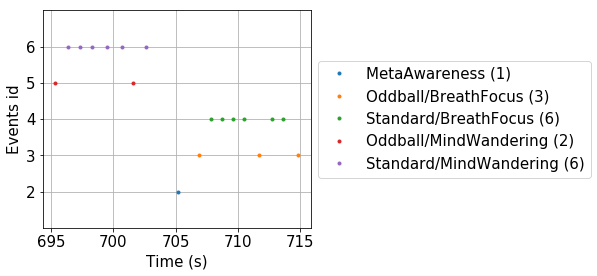

17 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 17 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
5 bad epochs dropped
1 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 1 events and 4441 original time points ...
0 bad epochs dropped


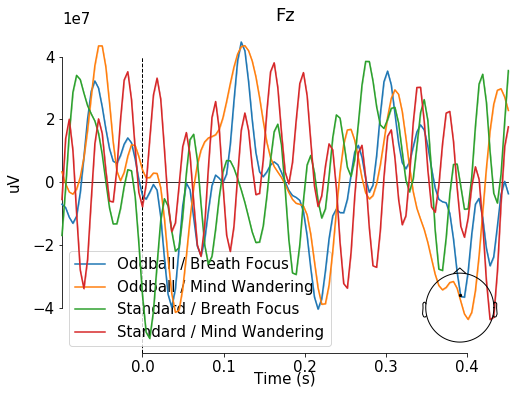

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


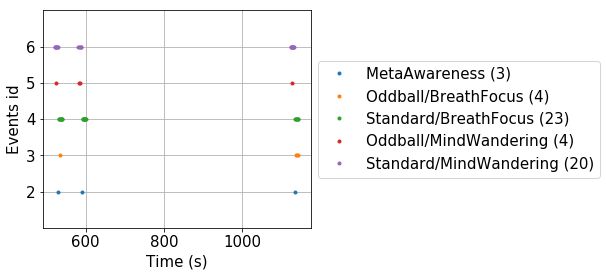

51 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 51 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Re

/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Applications/anaconda3/envs/acc/lib/python3.6/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
<ipython-input-117-49b769fcb8d7>:28: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  std_bf[sub] = epochs_mmn['Standard/BreathFocus'].average()
<ipython-input-117-49b769fcb8d7>:29: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  odd_bf[sub] = epochs_mmn['Oddball/BreathFocus'].average()
<ipython-input-117-49b769fcb8d7>:31: RuntimeWarning: evoked object is empty (based on less than 1 epoch)
  odd_mw[sub] = epochs_mmn['Oddball/MindWandering'].average()
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, 

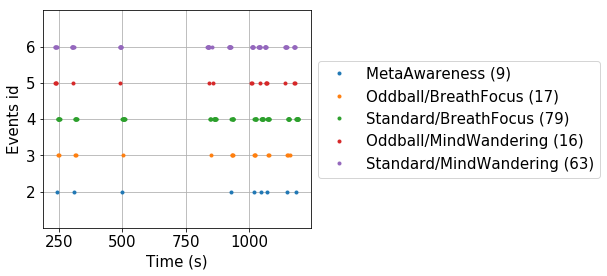

175 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 175 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
10 bad epochs dropped
9 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 9 events and 4441 original time points ...
0 bad epochs dropped


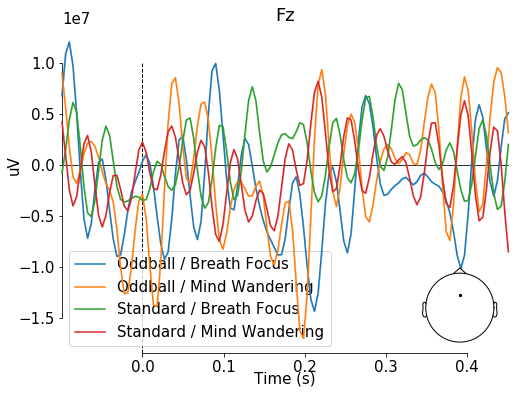

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


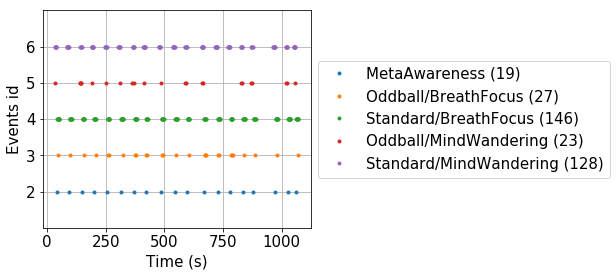

324 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 324 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    

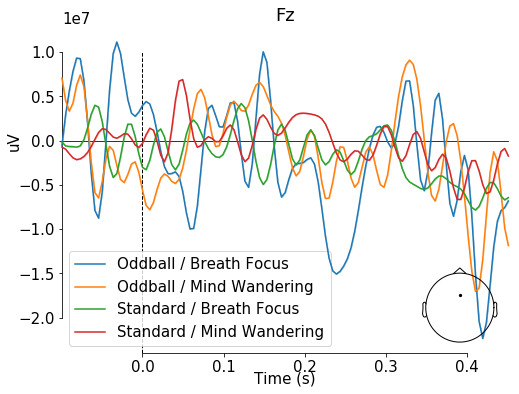

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


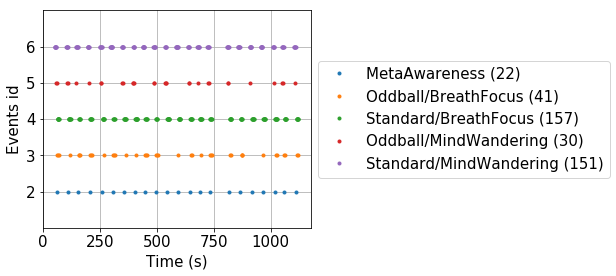

379 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 379 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    

    Rejecting  epoch based on EEG : ['O1', 'O2']
1 bad epochs dropped


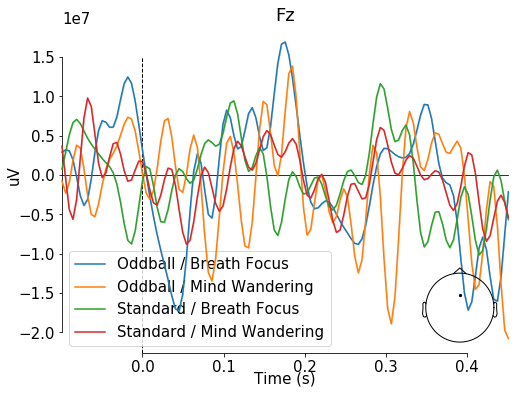

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


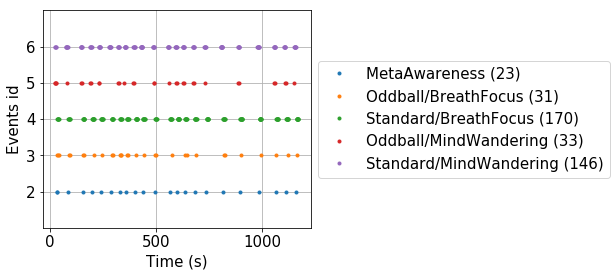

380 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 380 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
15 bad epochs dropped
23 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 23 events and 4441 original tim

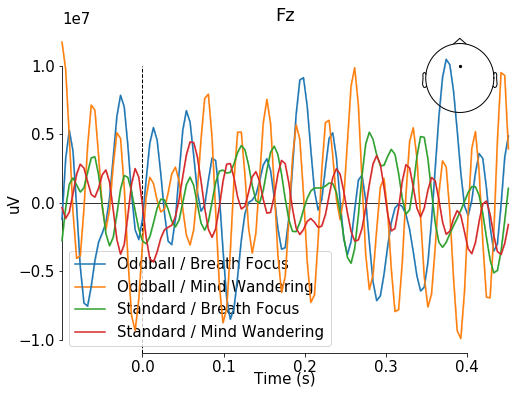

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


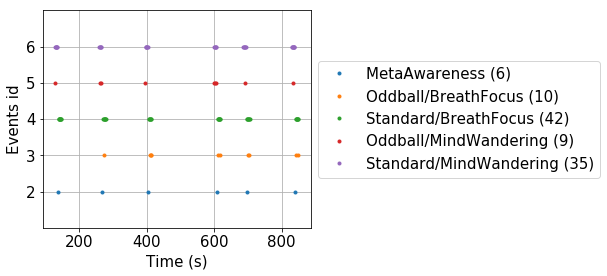

96 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 96 events and 667 original time points ...
0 bad epochs dropped
6 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 6 events and 4441 original time points ...
0 bad epochs dropped


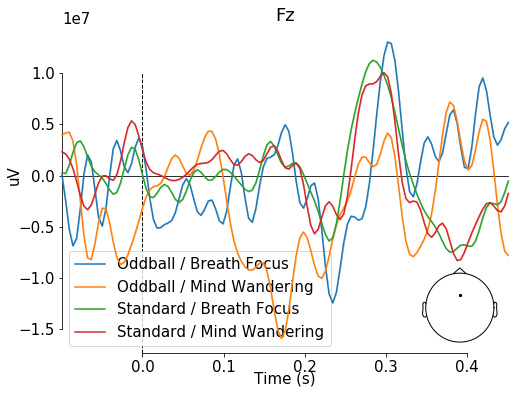

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


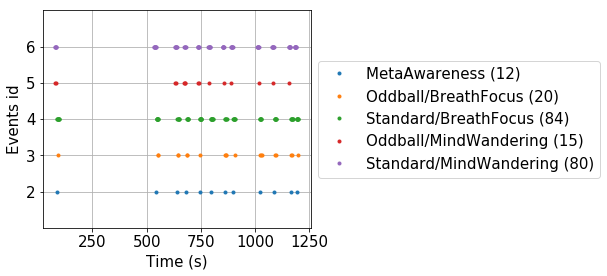

199 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 199 events and 667 original time points ...
2 bad epochs dropped
12 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 12 events and 4441 original time points ...
1 bad epochs dropped


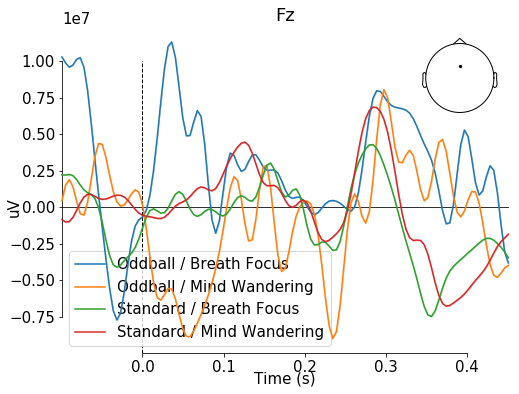

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


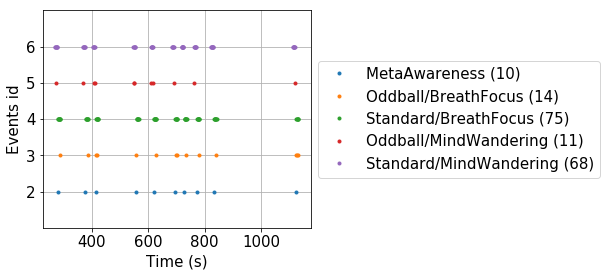

168 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 168 events and 667 original time points ...
0 bad epochs dropped
10 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 10 events and 4441 original time points ...
0 bad epochs dropped


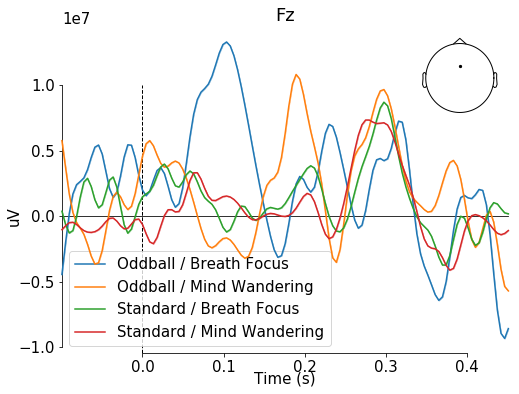

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


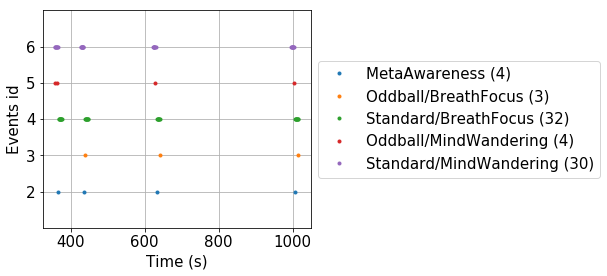

69 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 69 events and 667 original time points ...
0 bad epochs dropped
4 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 4 events and 4441 original time points ...
0 bad epochs dropped


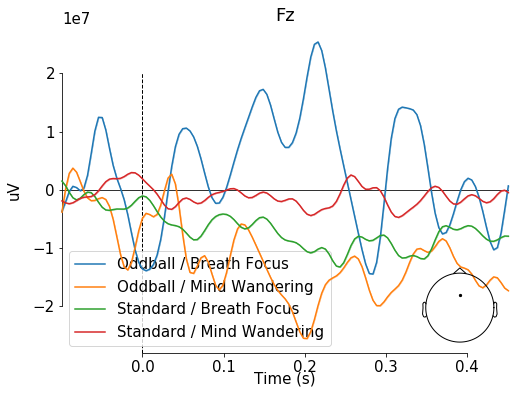

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


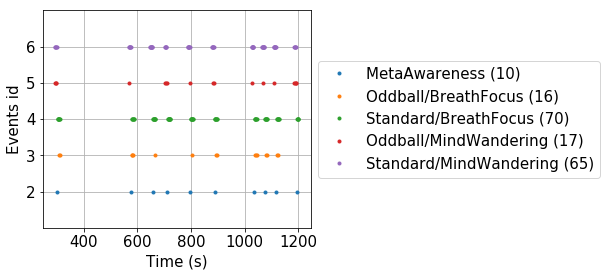

168 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 168 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
5 bad epochs dropped
10 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 10 events and 4441 original time points ...
    Rejecting  epoch based on EEG : ['O1']
    Rejecting  epoch based on EEG : ['O1', 'O2']
3 bad epochs dropped


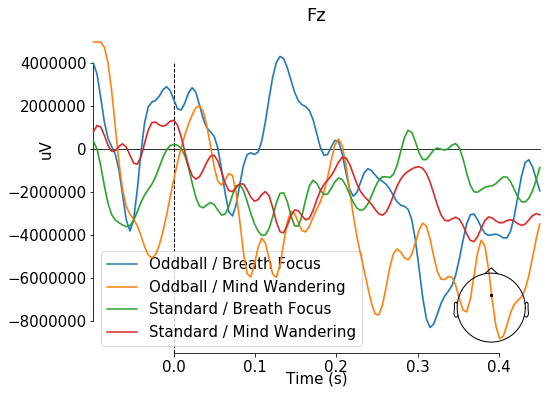

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


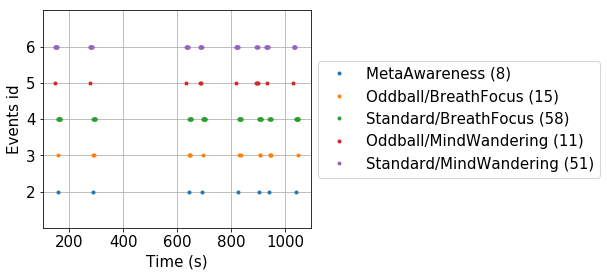

135 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 135 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
6 bad epochs dropped
8 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 8 events and 4441 original time points ...
    Rejecting  epoch based on EEG : ['O1', 'O2']
    Rejecting  epoch based on EEG : ['O1']
2 bad epochs dropped


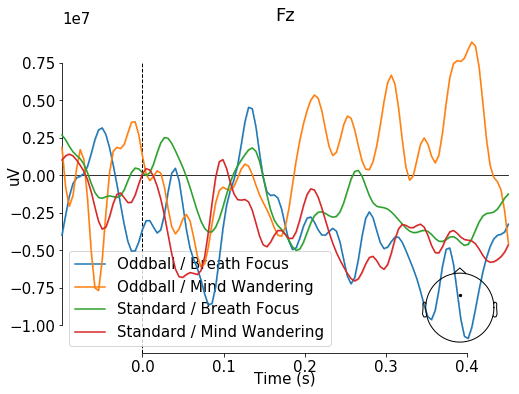

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


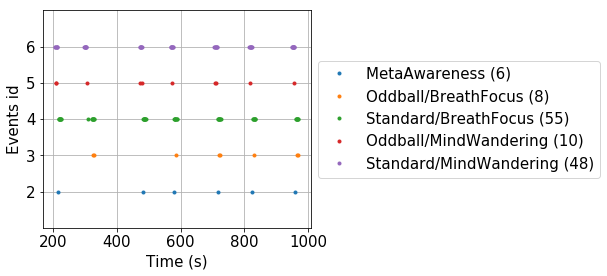

121 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 121 events and 667 original time points ...
0 bad epochs dropped
6 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 6 events and 4441 original time points ...
0 bad epochs dropped


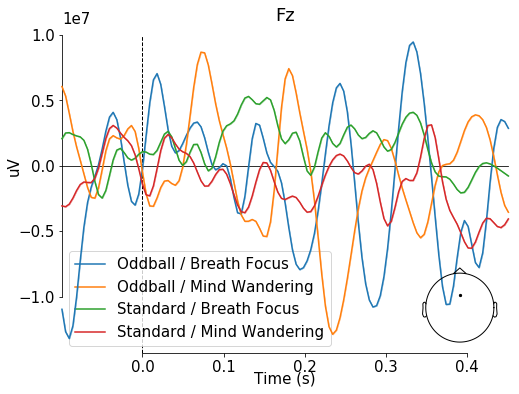

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


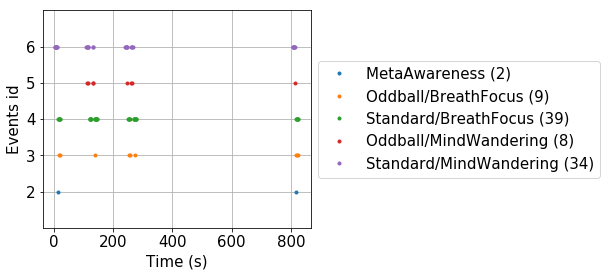

90 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 90 events and 667 original time points ...
0 bad epochs dropped
2 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 2 events and 4441 original time points ...
0 bad epochs dropped


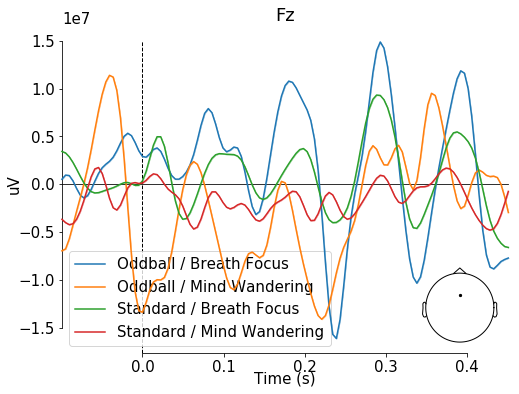

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


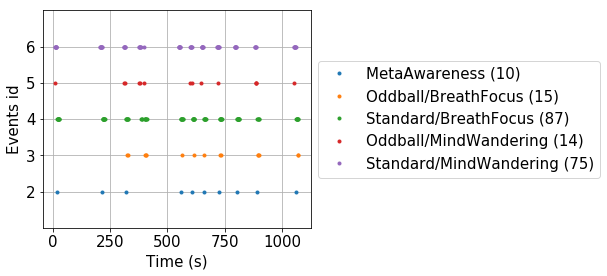

191 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 191 events and 667 original time points ...
0 bad epochs dropped
10 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 10 events and 4441 original time points ...
0 bad epochs dropped


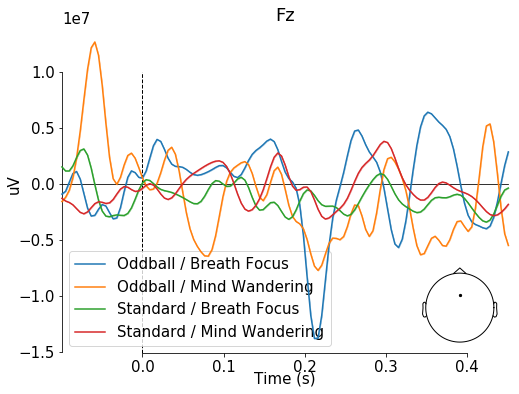

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


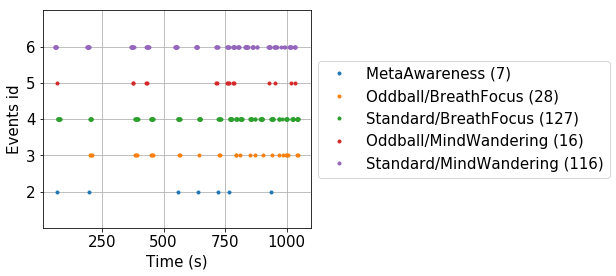

287 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 287 events and 667 original time points ...
0 bad epochs dropped
7 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 7 events and 4441 original time points ...
0 bad epochs dropped


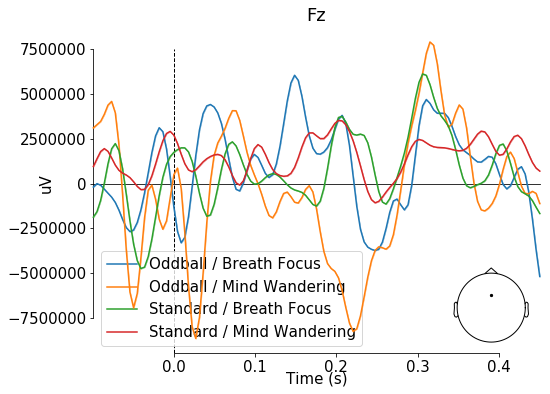

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


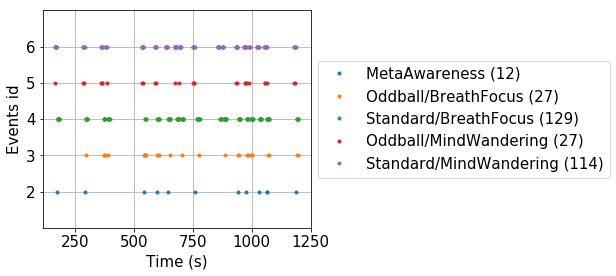

297 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 297 events and 667 original time points ...
0 bad epochs dropped
12 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 12 events and 4441 original time points ...
    Rejecting  epoch based on EEG : ['O2']
1 bad epochs dropped


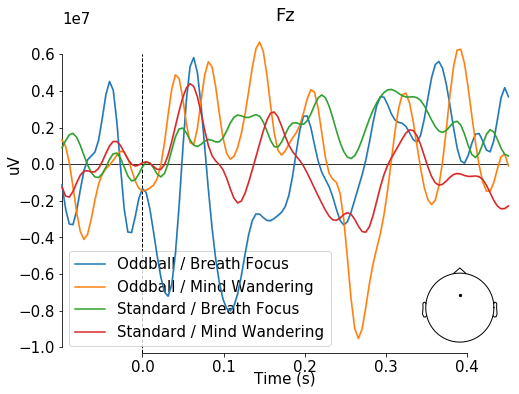

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


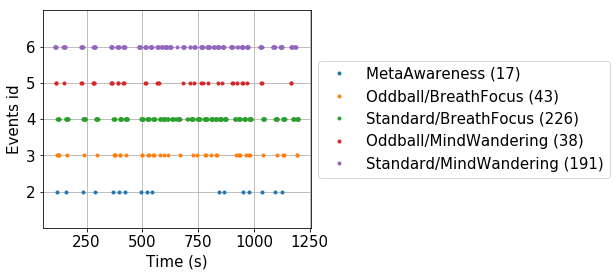

498 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 498 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    

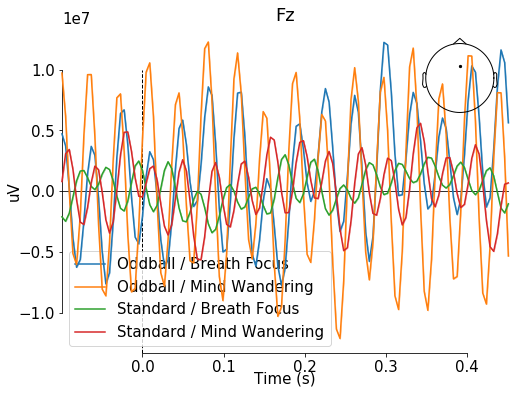

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


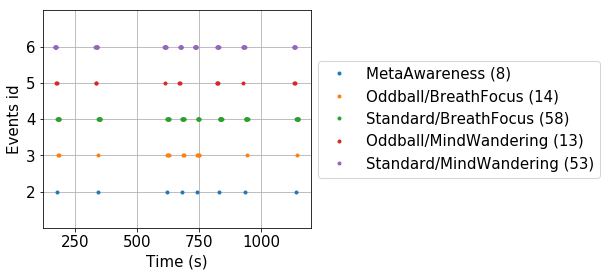

138 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 138 events and 667 original time points ...
0 bad epochs dropped
8 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 8 events and 4441 original time points ...
0 bad epochs dropped


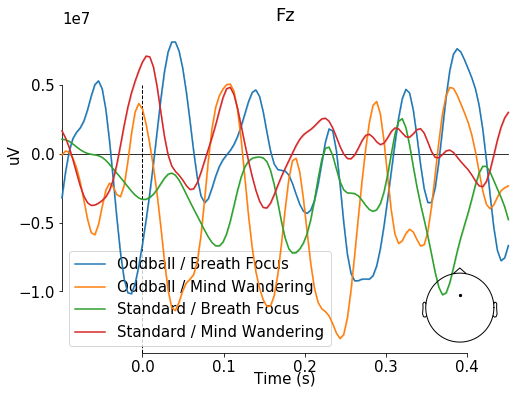

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


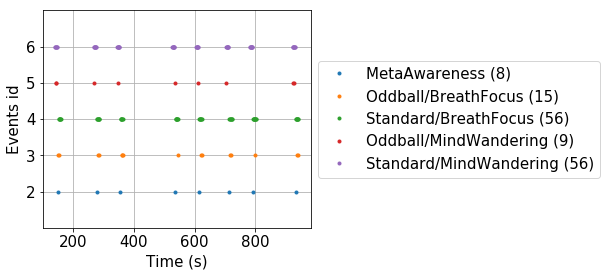

136 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 136 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
2 bad epochs dropped
8 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 8 events and 4441 original time points ...
0 bad epochs dropped


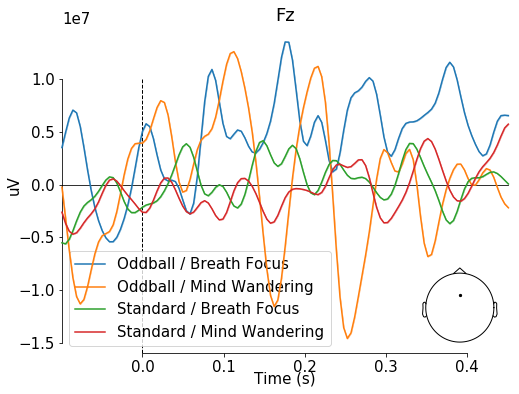

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


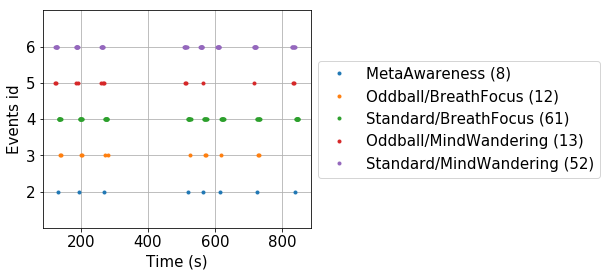

138 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 138 events and 667 original time points ...
0 bad epochs dropped
8 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 8 events and 4441 original time points ...
0 bad epochs dropped


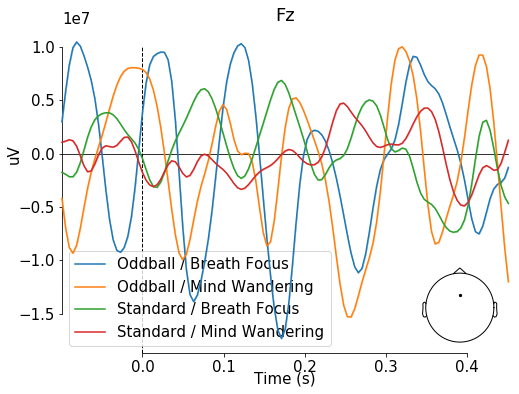

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


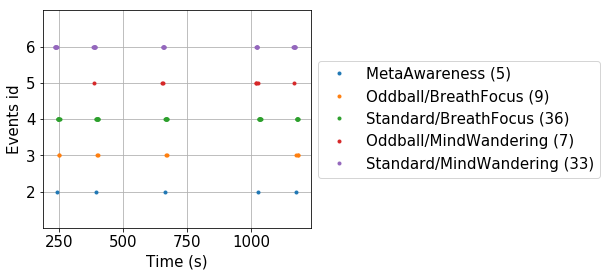

85 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 85 events and 667 original time points ...
0 bad epochs dropped
5 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 5 events and 4441 original time points ...
0 bad epochs dropped


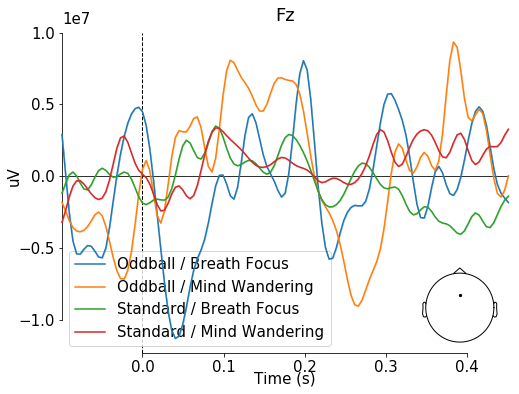

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


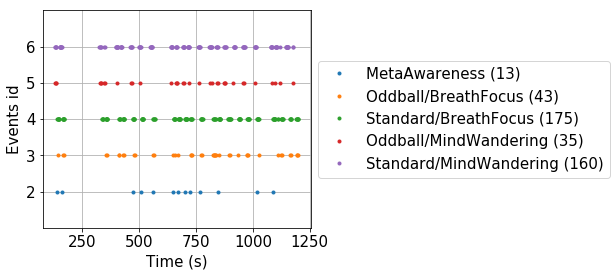

413 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 413 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
20 bad epochs dropped
13 matching events found


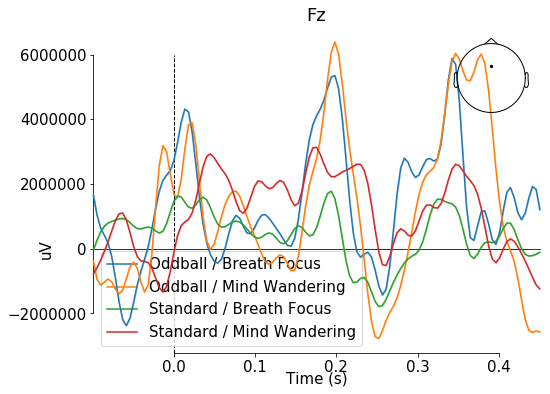

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


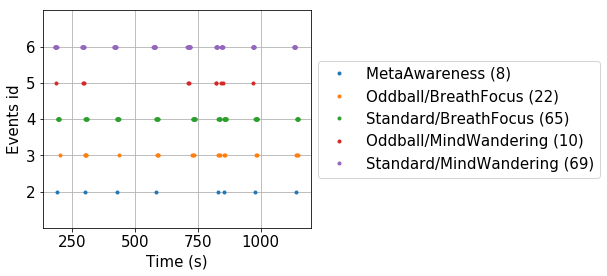

166 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 166 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
7 bad epochs dropped
8 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 8 events and 4441 original time points ...
0 bad epochs dropped


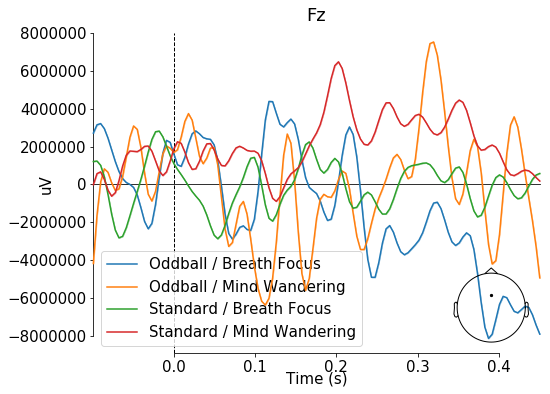

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


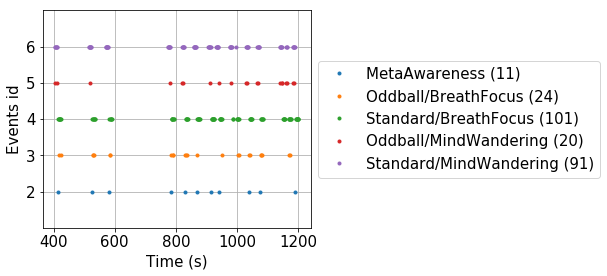

236 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 236 events and 667 original time points ...
2 bad epochs dropped
11 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 11 events and 4441 original time points ...
0 bad epochs dropped


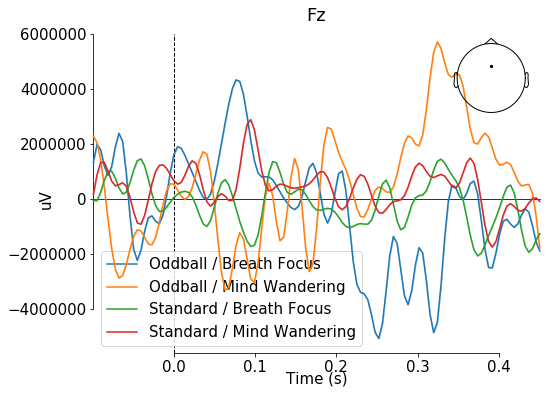

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


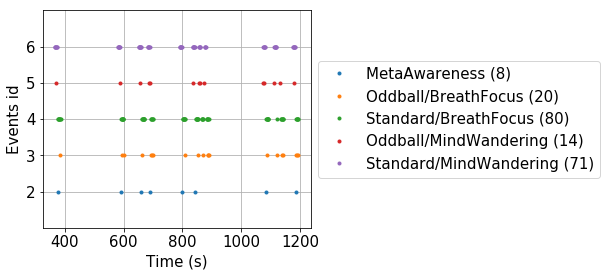

185 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 185 events and 667 original time points ...
0 bad epochs dropped
8 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 8 events and 4441 original time points ...
0 bad epochs dropped


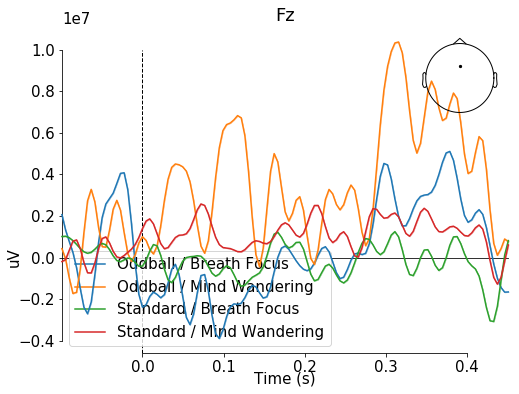

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 7 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


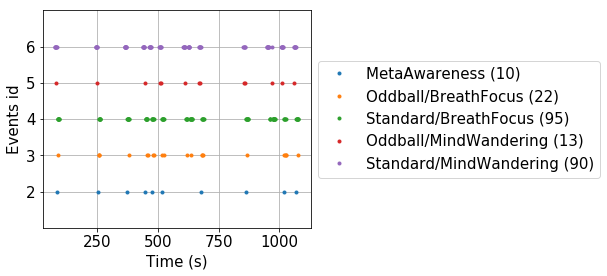

220 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 220 events and 667 original time points ...
0 bad epochs dropped
10 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 10 events and 4441 original time points ...
0 bad epochs dropped


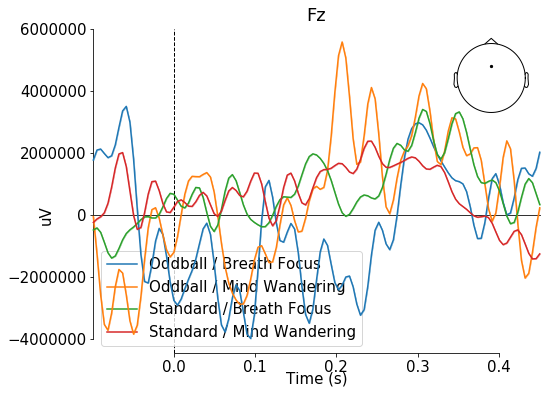

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


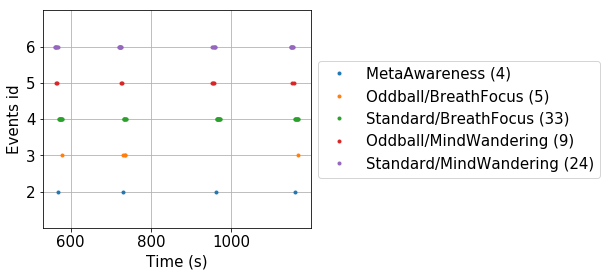

71 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 71 events and 667 original time points ...
0 bad epochs dropped
4 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 4 events and 4441 original time points ...
0 bad epochs dropped


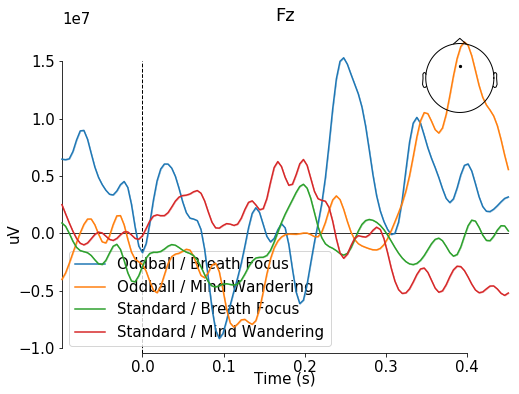

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


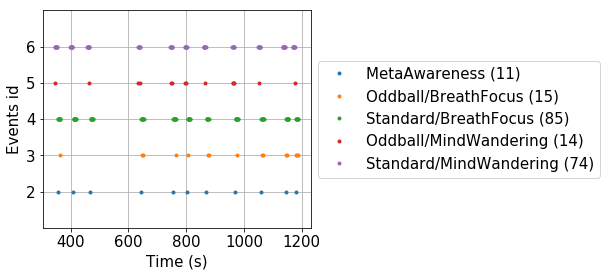

188 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 188 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
4 bad epochs dropped
11 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 11 events and 4441 original time points ...
    Rejecting  epoch based on EEG : ['O1', 'O2']
1 bad epochs dropped


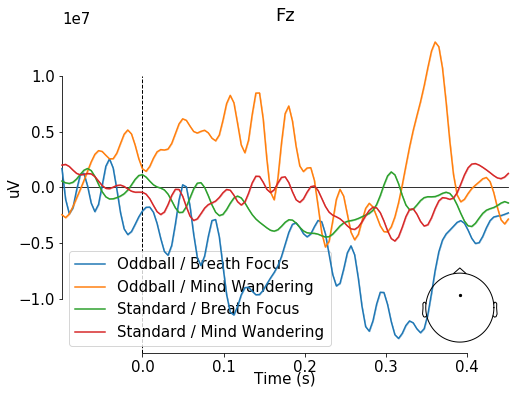

<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 0 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
<ipython-input-117-49b769fcb8d7>:22: RuntimeWarning: event 1 missing from event_id will be ignored
  mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])


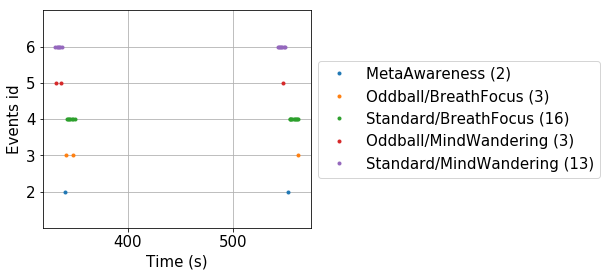

35 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 35 events and 667 original time points ...
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
    Rejecting  epoch based on EEG : ['Fz']
3 bad epochs dropped
2 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
Loading data for 2 events and 4441 original time points ...
    Rejecting  epoch based on EEG : ['O1', 'O2']
1 bad epochs dropped


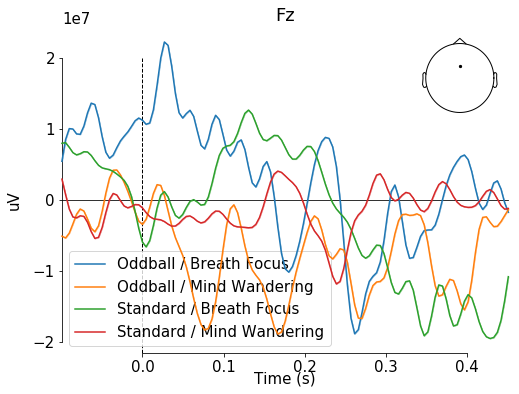

In [117]:
event_dict = {'MetaAwareness' : 2, 'Oddball/BreathFocus' : 3, 'Standard/BreathFocus' : 4,
              'Oddball/MindWandering' : 5, 'Standard/MindWandering' : 6}
events_mmn = {'Oddball/BreathFocus' : 3, 'Standard/BreathFocus' : 4, 'Oddball/MindWandering' : 5,
              'Standard/MindWandering' : 6}
events_tf = {'MetaAwareness' : 2}

rejection = dict(eeg=200)  # rejecting epochs > 200 μV

std_bf = {}  # dictionary for averaged 3s epochs standard / breath focus
odd_bf = {}  # dictionary for averaged 3s epochs oddball / breath focus
std_mw = {}  # dictionary for averaged 3s epochs standard / mind wandering
odd_mw = {}  # dictionary for averaged 3s epochs oddball / mind wandering
time_frequency = {}  # dictionary for averaged 20s epochs for time.frequency analysis

for sub in auditory:
    # concatenating onset times and event codes for auditory and meta awareness data
    onsets = auditory[sub]['Stimulus onset (audio)'].append(mw[sub]['Time (meta awareness)'])
    event_types = auditory[sub]['Stimulus type'].append(mw[sub]['Stimulus type'])
    # creating event array compatible with MNE
    events = np.array([[find_sample(sub, onset), 0, event_type] for onset, event_type in zip(onsets, event_types)], dtype=int)
    # visualizing event distribution
    mne.viz.plot_events(events, event_id=event_dict, sfreq=raw[sub].info['sfreq'])
    
    epochs_mmn = mne.Epochs(raw[sub], events, event_id=events_mmn, tmin=-1., tmax=2., baseline=(-0.3, 0.), picks=[1], reject=rejection, preload=True, on_missing='ignore')
    epochs_mmn = epochs_mmn.crop(tmin=-0.1, tmax=0.45) # crop MMN epochs to [-100 ms, 450 ms]
    epochs_tf = mne.Epochs(raw[sub], events, event_id=events_tf, tmin=-10., tmax=10., baseline=None, picks=[6,7], reject=rejection, preload=True, on_missing='ignore')
    
    std_bf[sub] = epochs_mmn['Standard/BreathFocus'].average()
    odd_bf[sub] = epochs_mmn['Oddball/BreathFocus'].average()
    std_mw[sub] = epochs_mmn['Standard/MindWandering'].average()
    odd_mw[sub] = epochs_mmn['Oddball/MindWandering'].average()
    
    time_frequency[sub] = epochs_tf.average()
        
    if std_bf[sub].nave > 0 and odd_bf[sub].nave > 0 and std_mw[sub].nave > 0 and odd_mw[sub].nave > 0:
        conditions = {'Standard / Breath Focus' : std_bf[sub], 'Oddball / Breath Focus' : odd_bf[sub],
                      'Standard / Mind Wandering' : std_mw[sub], 'Oddball / Mind Wandering' : odd_mw[sub]}
        mne.viz.plot_compare_evokeds(conditions, picks=[0])    

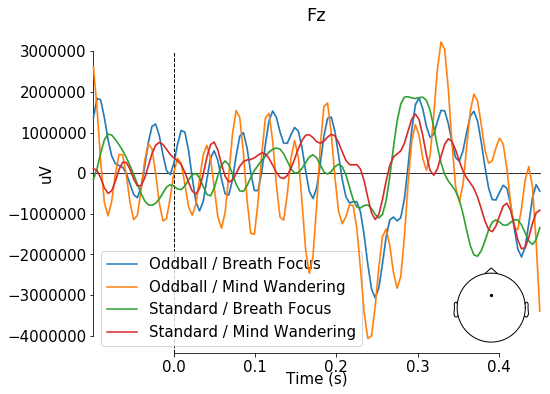

In [118]:
# Grand average of ERPs
std_bf_avg = []  
odd_bf_avg = [] 
std_mw_avg = []
odd_mw_avg = []

for sub in raw:
    if std_bf[sub].nave > 0:
        std_bf_avg.append(std_bf[sub])
    if odd_bf[sub].nave > 0:
        odd_bf_avg.append(odd_bf[sub])
    if std_mw[sub].nave > 0:
        std_mw_avg.append(std_mw[sub])
    if odd_mw[sub].nave > 0:
        odd_mw_avg.append(odd_mw[sub])
    

conditions = {'Standard / Breath Focus' : mne.combine_evoked(std_bf_avg, weights='nave'),
              'Oddball / Breath Focus' : mne.combine_evoked(odd_bf_avg, weights='nave'),
              'Standard / Mind Wandering' : mne.combine_evoked(std_mw_avg, weights='nave'),
              'Oddball / Mind Wandering' : mne.combine_evoked(odd_mw_avg, weights='nave')}
mne.viz.plot_compare_evokeds(conditions, picks=[0], ci=True) 
plt.show()

## ERP analysis: Auditory Mismatch Negativity

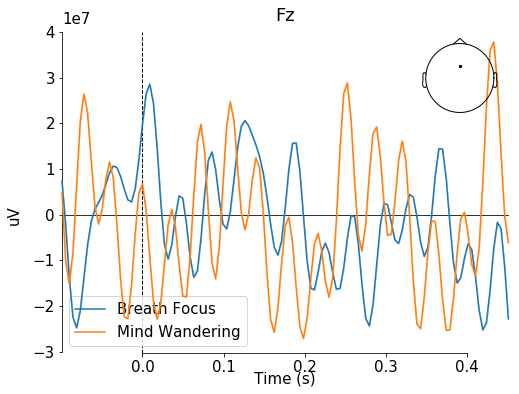

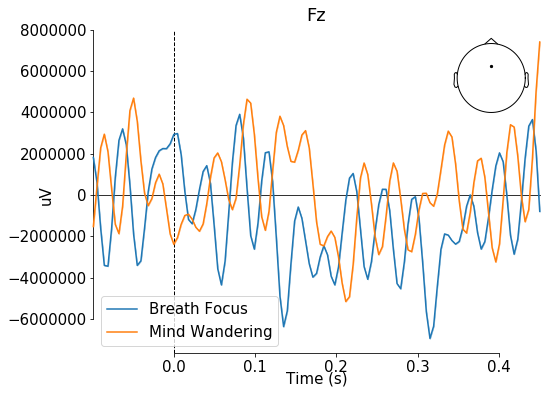

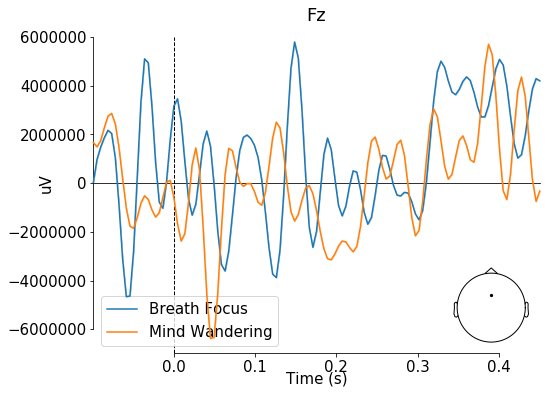

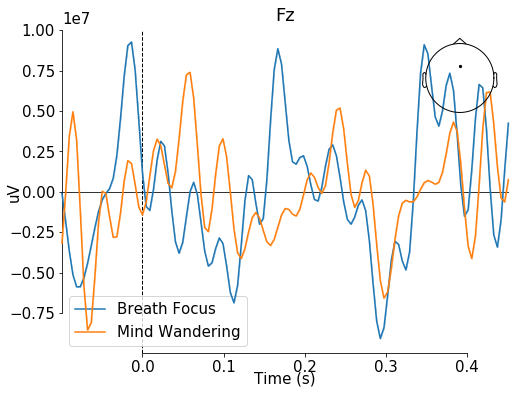

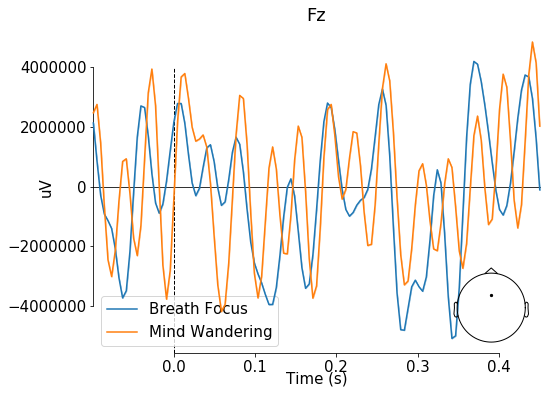

...

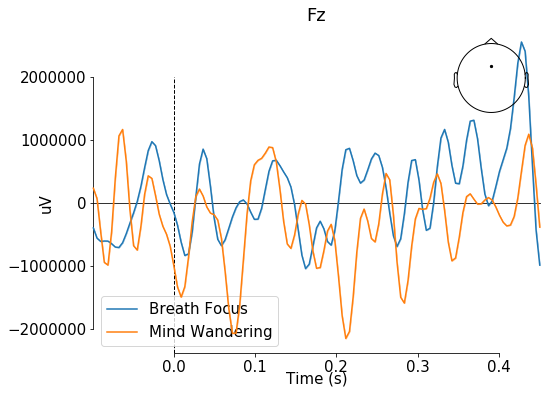

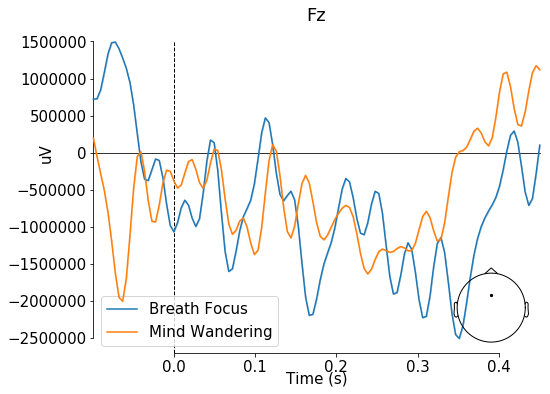

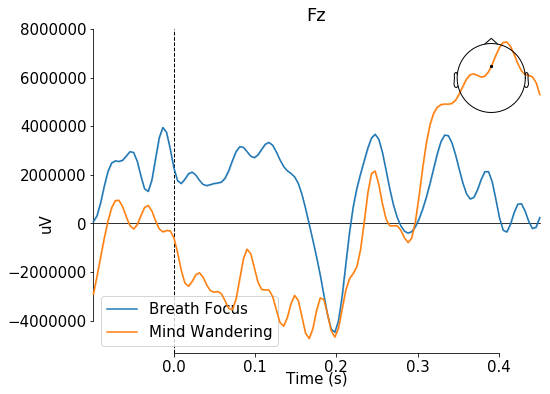

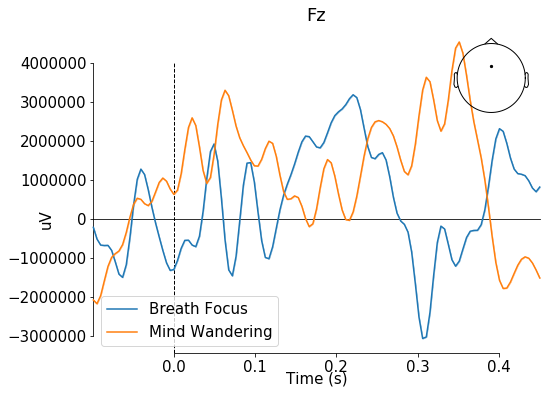

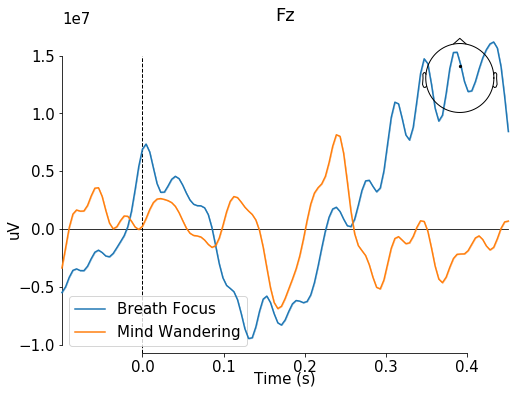

In [119]:
# mismatch negativity (oddball - standard) for each block
for sub in eeg:
    if std_bf[sub].nave > 0 and odd_bf[sub].nave > 0 and std_mw[sub].nave > 0 and odd_mw[sub].nave > 0:
        conditions = {'Mind Wandering' : mne.combine_evoked([odd_mw[sub], -std_mw[sub]], weights='nave'),
                      'Breath Focus' : mne.combine_evoked([odd_bf[sub], -std_bf[sub]], weights='nave')}
        mne.viz.plot_compare_evokeds(conditions, picks=[0], ci=True)
        plt.show

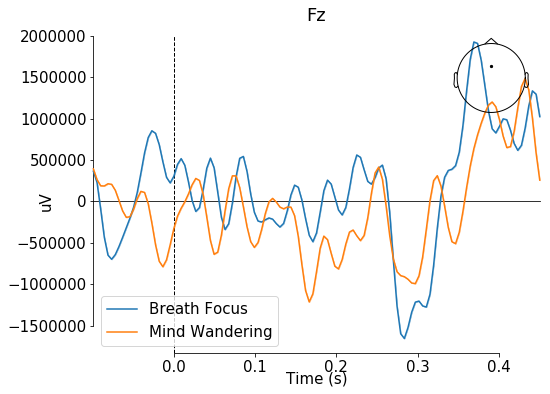

In [120]:
# Grand average of MMN
mmn_mw_avg = []
mmn_bf_avg = []

for sub in raw:
    if odd_mw[sub].nave > 0 and std_mw[sub].nave > 0:
        mmn_mw_avg.append(mne.combine_evoked([odd_mw[sub], -std_mw[sub]], weights='nave'))
    if odd_bf[sub].nave > 0 and std_bf[sub].nave > 0:
        mmn_bf_avg.append(mne.combine_evoked([odd_bf[sub], -std_bf[sub]], weights='nave'))
        
conditions = {'Mind Wandering' : mne.combine_evoked(mmn_mw_avg, weights='nave'),
              'Breath Focus' : mne.combine_evoked(mmn_bf_avg, weights='nave')}
mne.viz.plot_compare_evokeds(conditions, picks=[0], ci=True)
plt.show()

## Time-frequency analysis
Braboszcz et al. applied Morlet wavelet decomposition to the 20 sec long epochs time-locked buttons presses aka meta awareness events. They used 200 linearly-spaced time points and a series of 100 log-spaced frequencies ranging from 1 Hz to 100 Hz, with 1.5 cycle at the lowest frequency increasing linearly and capping at eight cycles at 30 Hz.

Since we are only interested in changes in delta, theta, alpha and beta frequency bands we will only consider frequencies from 1 Hz to 30 Hz in the present analysis.

In [121]:
#  Morlet wavelet decomposition mind wandering vs. breath focus
tf_epochs = []
for sub in raw:
    if time_frequency[sub].nave > 0:
        tf_epochs.append(time_frequency[sub])
tf_epochs = mne.combine_evoked(tf_epochs, weights='nave')
frequencies = np.arange(1, 31, 1)  # linear spaced frequencies from 1 to 30 Hz
n_cycles = np.arange(1.5, 8.01, 13/58)  # linear cycle increase from 1.5 to 8 cycles
power = mne.time_frequency.tfr_morlet(tf_epochs, frequencies, n_cycles, return_itc=False)

No baseline correction applied


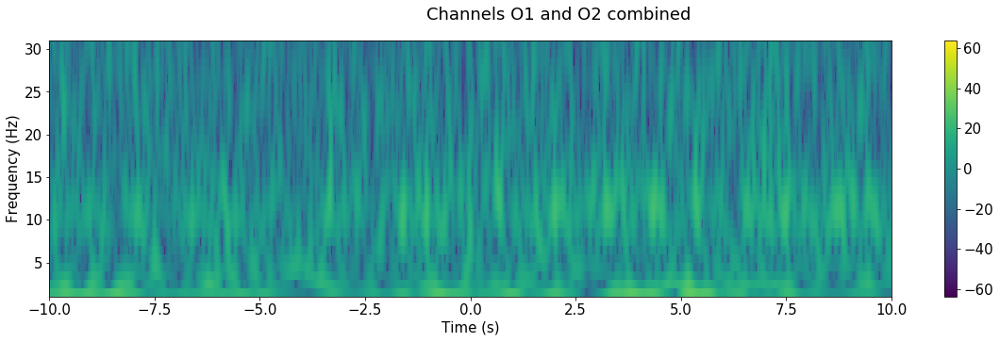

In [122]:
# Time-frequency decomposition of transition from mind wandering to breath focus
fig, ax = plt.subplots(figsize=(20,5))
power.plot(picks=[0,1], dB=True, combine='mean', cmap='viridis', title='Channels O1 and O2 combined', axes=ax)
plt.show()

No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied
No baseline correction applied


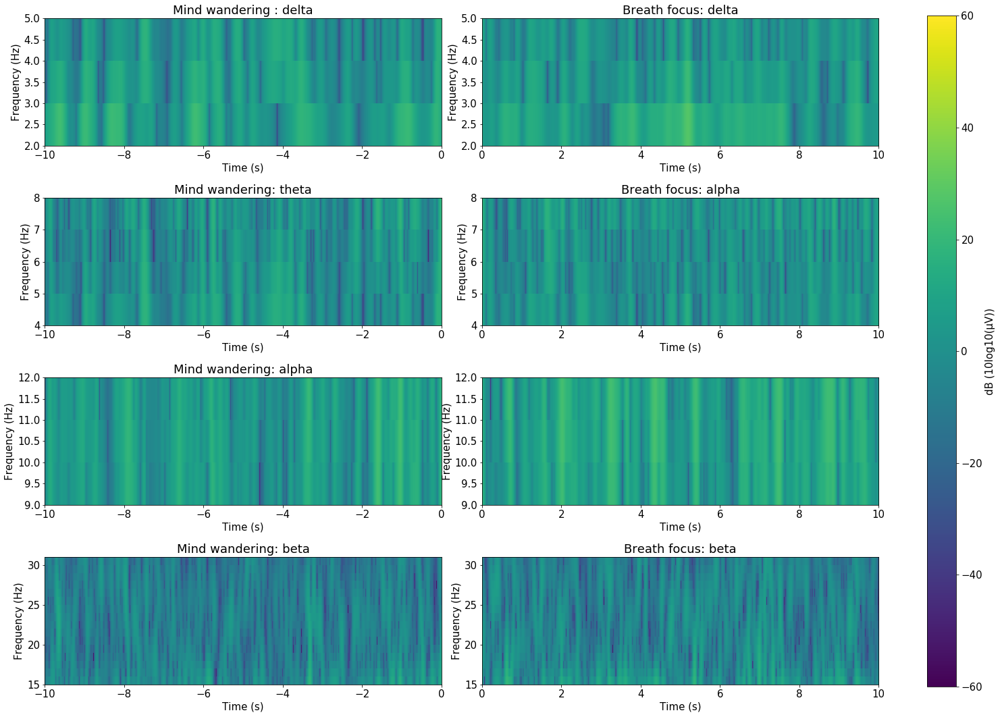

In [123]:
# contrasting individual frequency bands
plt.rcParams.update({'font.size': 15})
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(20,15))

power.plot(picks=[0,1], dB=True, combine='mean', tmin=-10., tmax=0., fmin=2., fmax=4., vmin=-60., vmax=60., cmap='viridis', axes=ax[0,0], show=False, colorbar=False)
power.plot(picks=[0,1], dB=True, combine='mean', tmin=-10., tmax=0., fmin=4., fmax=7., vmin=-60., vmax=60., cmap='viridis', axes=ax[1,0], show=False, colorbar=False)
power.plot(picks=[0,1], dB=True, combine='mean', tmin=-10., tmax=0., fmin=9., fmax=11., vmin=-60., vmax=60., cmap='viridis', axes=ax[2,0], show=False, colorbar=False)
power.plot(picks=[0,1], dB=True, combine='mean', tmin=-10., tmax=0., fmin=15., fmax=30., vmin=-60., vmax=60., cmap='viridis', axes=ax[3,0], show=False, colorbar=False)
power.plot(picks=[0,1], dB=True, combine='mean', tmin=0., tmax=10., fmin=2., fmax=4., vmin=-60., vmax=60., cmap='viridis', axes=ax[0,1], show=False, colorbar=False)
power.plot(picks=[0,1], dB=True, combine='mean', tmin=0., tmax=10., fmin=4., fmax=7., vmin=-60., vmax=60., cmap='viridis', axes=ax[1,1], show=False, colorbar=False)
power.plot(picks=[0,1], dB=True, combine='mean', tmin=0., tmax=10., fmin=9., fmax=11., vmin=-60., vmax=60., cmap='viridis', axes=ax[2,1], show=False, colorbar=False)
power.plot(picks=[0,1], dB=True, combine='mean', tmin=0., tmax=10., fmin=15., fmax=30., vmin=-60., vmax=60., cmap='viridis', axes=ax[3,1], show=False, colorbar=False)

ax[0,0].set(title='Mind wandering : delta')
ax[1,0].set(title='Mind wandering: theta')
ax[2,0].set(title='Mind wandering: alpha')
ax[3,0].set(title='Mind wandering: beta')
ax[0,1].set(title='Breath focus: delta')
ax[1,1].set(title='Breath focus: theta')
ax[1,1].set(title='Breath focus: alpha')
ax[3,1].set(title='Breath focus: beta')
fig.suptitle('')
fig.tight_layout()

# adding custom colorbar
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.95, 0.05, 0.03, 0.92])
colorbar = matplotlib.colorbar.ColorbarBase(cbar_ax, cmap='viridis',
                                norm=matplotlib.colors.Normalize(vmin=-60., vmax=60.),
                                orientation='vertical')
colorbar.set_label('dB (10log10(μV))')

plt.show()